<a href="https://colab.research.google.com/github/kittimaxz/Project_BoneAge/blob/main/BoneAgePredictor_limit128_GradCam5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import Dataset, DataLoader
from torch.optim.lr_scheduler import ReduceLROnPlateau
import os
import pandas as pd
from PIL import Image
import skimage.transform

In [2]:
from google.colab import drive # เชื่อม drive ของเรา ถ้าเชื่อมสำเร็จจะขึ้นคำว่าMounted at /content/drive 
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
def dataset_path(*rel_path):
    return os.path.join('/content/drive/My Drive/Project_Boneage', *rel_path);

In [4]:
transform = transforms.Compose([
    transforms.ToTensor()
])

In [5]:
class BoneAgeTrainingDataset(Dataset):
    def __init__(self,csv_path,img_folder):
        self.csv = pd.read_csv(dataset_path(csv_path));
        self.img_folder = img_folder;        

    def __len__(self):
        return self.csv.shape[0]

    def __getitem__(self, idx):
        male = np.array([1]) if (self.csv['male'][idx] == 'TRUE') else np.array([0])
        return transform(Image.open(dataset_path(self.img_folder,str(self.csv['id'][idx])+'.png')).resize((256,256))).double(),\
               torch.from_numpy(np.array(self.csv['boneage zscore'][idx])).double(),\
               torch.from_numpy(male).double()

In [6]:
class BoneAgeValidationDataset(Dataset):
    def __init__(self,csv_path,img_folder):
        self.csv = pd.read_csv(dataset_path(csv_path));
        self.img_folder = img_folder;        

    def __len__(self):
        return self.csv.shape[0]

    def __getitem__(self, idx):
        male = np.array([1]) if (self.csv['male'][idx] == 'TRUE') else np.array([0])
        return transform(Image.open(dataset_path(self.img_folder,str(self.csv['id'][idx])+'.png')).resize((256,256))).double(),\
               torch.from_numpy(np.array(self.csv['boneage zscore'][idx])).double(),\
               torch.from_numpy(male).double()

In [7]:
class BoneAgeTestingDataset(Dataset):
    def __init__(self,csv_path,img_folder):
        self.csv = pd.read_csv(dataset_path(csv_path));
        self.img_folder = img_folder;        

    def __len__(self):
        return self.csv.shape[0]

    def __getitem__(self, idx):
        male = np.array([1]) if (self.csv['male'][idx] == 'TRUE') else np.array([0])
        return transform(Image.open(dataset_path(self.img_folder,str(self.csv['id'][idx])+'.png')).resize((256,256))).double(),\
               torch.from_numpy(np.array(self.csv['boneage'][idx])).double(),\
               torch.from_numpy(male).double()

In [8]:
class BoneAgePredictor(nn.Module):
    def __init__(self):
        super(BoneAgePredictor, self).__init__()
        # Layer 1
        self.conv1 = nn.Conv2d(1, 16, 3)
        nn.init.kaiming_normal_(self.conv1.weight)
        self.batch1 = nn.BatchNorm2d(16)
        # Layer 2
        self.conv2 = nn.Conv2d(16, 32, 3)
        nn.init.kaiming_normal_(self.conv2.weight)
        self.batch2 = nn.BatchNorm2d(32)
        # Layer 3
        self.conv3 = nn.Conv2d(32, 64, 3)
        nn.init.kaiming_normal_(self.conv3.weight)
        self.batch3 = nn.BatchNorm2d(64)
        # Layer 4
        self.conv4 = nn.Conv2d(64, 128, 3)
        nn.init.kaiming_normal_(self.conv4.weight)
        self.batch4 = nn.BatchNorm2d(128)
        # Layer 5
        self.conv5 = nn.Conv2d(128, 128, 3)
        nn.init.kaiming_normal_(self.conv5.weight)
        self.batch5 = nn.BatchNorm2d(128)
        # Fully connected
        self.fc1 = nn.Linear(4609, 68)
        self.fc2 = nn.Linear(69, 1)
        #self.fc2 = nn.Linear(64, 1)
    
        

    def forward(self, x, m):
        # Layer 1
        x = F.relu(self.batch1(self.conv1(x)))
        x = F.max_pool2d(x, 2)
        # Layer 2
        x = F.relu(self.batch2(self.conv2(x)))
        x = F.max_pool2d(x, 2)
        # Layer 3
        x = F.relu(self.batch3(self.conv3(x)))
        x = F.max_pool2d(x, 2)
        # Layer 4
        x = F.relu(self.batch4(self.conv4(x)))
        x = F.max_pool2d(x, 2)
        # Layer 5
        x = F.relu(self.batch5(self.conv5(x)))
        x = F.max_pool2d(x, 2)
        
        # Pooling
        x = x.view(-1,4608)
        x = torch.cat((x,m), axis = 1)
        x = self.fc1(x)
        x = torch.cat((x,m), axis = 1)
        x = self.fc2(x)
        #x = torch.cat((x,m), axis = 1)
        #x = self.fc3(x)
        return x

In [9]:
def train(model, device, train_loader, optimizer, epoch):
    model.train()
    for batch_idx, (data, target, male) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data, male)
        loss = F.l1_loss(output.view(-1), target)
        loss.backward()
        optimizer.step()
        #print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                #epoch, batch_idx * len(data), len(train_loader.dataset),
                #100. * batch_idx / len(train_loader), loss.item()))

In [10]:
def validation(model, device, val_loader, loader_name):
    model.eval()
    loss = 0
    with torch.no_grad():
        for batch_idx, (data, target, male) in enumerate(val_loader):
            data, target = data.to(device), target.to(device)
            output = model(data, male)
            loss += F.l1_loss(output.view(-1), target, reduction='sum').item()  # sum up batch loss            
    loss /= len(val_loader.dataset)
    print('\n', 'EPOCH {} '.format(epoch))
    print('\n', loader_name, 'set: Average loss: {:.4f}\n'.format(loss))
    return loss;
     

In [11]:
def test(model, device, loader, loader_name):
    model.eval()
    loss = 0
    with torch.no_grad():
        for batch_idx, (data, target, male) in enumerate(loader):
            data, target = data.to(device), target.to(device)
            output = model(data, male)
            loss += F.l1_loss(output.view(-1), target, reduction='sum').item()  # sum up batch loss            
    loss /= len(loader.dataset)
    print('\n', loader_name, 'set: Average loss: {:.4f}\n'.format(loss))
    return loss;

In [12]:
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
kwargs = {'num_workers': 0, 'pin_memory': True} if use_cuda else {}
trainig_data_loader = torch.utils.data.DataLoader(
    BoneAgeTrainingDataset('train_z.csv', 'boneage_training_dataset'),
    batch_size=32, shuffle=True, **kwargs)
validation_data_loader = torch.utils.data.DataLoader(
    BoneAgeValidationDataset('validation_z.csv', 'boneage_validation_dataset'),
    batch_size=32, shuffle=True, **kwargs)
testing_data_loader = torch.utils.data.DataLoader(
    BoneAgeTestingDataset('boneage-test-dataset.csv', 'boneage-test-dataset'),
    batch_size=32, shuffle=True, **kwargs)

In [13]:
device

device(type='cpu')

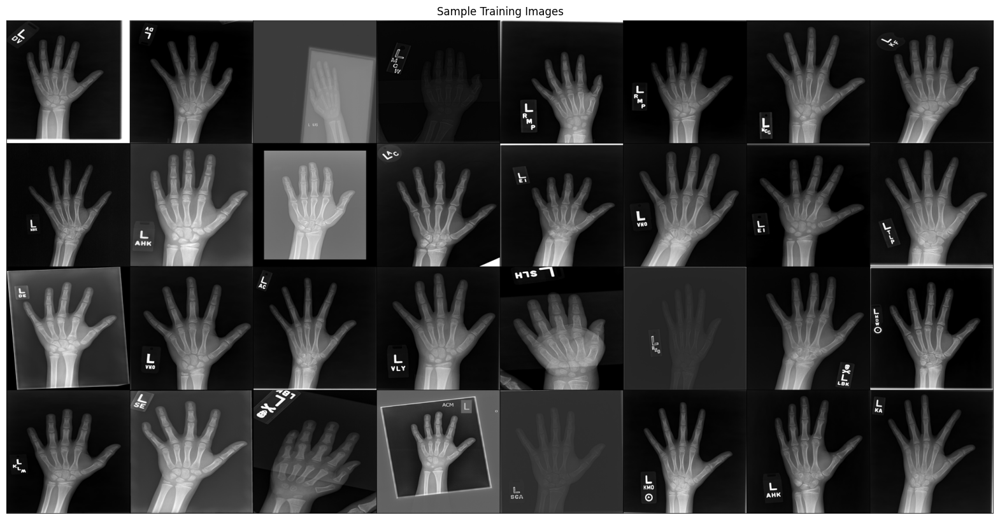

In [14]:
# Plot samples
import matplotlib.pyplot as plt
from torchvision import datasets, transforms, utils

sample_batch = next(iter(trainig_data_loader))
plt.figure(figsize=(20, 20)); plt.axis("off"); plt.title("Sample Training Images")
plt.imshow(np.transpose(utils.make_grid(sample_batch[0], padding=1, normalize=True),(1,2,0)));

In [15]:
model = BoneAgePredictor().double().to(device)
print(model)
optimizer = optim.Adam(model.parameters())
scheduler = ReduceLROnPlateau(optimizer, factor=0.1, patience=2, min_lr=0.0001, verbose=True)

BoneAgePredictor(
  (conv1): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1))
  (batch1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
  (batch2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
  (batch3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1))
  (batch4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv5): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1))
  (batch5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc1): Linear(in_features=4609, out_features=68, bias=True)
  (fc2): Linear(in_features=69, out_features=1, bias=True)
)


In [16]:
train_losses = []
val_losses = []
for epoch in range(20):
        train(model, device, trainig_data_loader, optimizer, epoch)
        train_loss = validation(model, device, trainig_data_loader,'Train')
        val_loss = validation(model, device, validation_data_loader,'Validation')
        scheduler.step(val_loss)
        train_losses.append(train_loss)
        val_losses.append(val_loss)
        checkpoint = torch.save({
            'epoch': epoch + 1,
            'train_loss': train_losses,
            'val_loss': val_losses,
            'state_dict': model.state_dict(),
            'optimizer': optimizer.state_dict()
        },'model3_070423.pth')


 EPOCH 0 

 Train set: Average loss: 0.6425


 EPOCH 0 

 Validation set: Average loss: 0.5897


 EPOCH 1 

 Train set: Average loss: 0.6202


 EPOCH 1 

 Validation set: Average loss: 0.5898


 EPOCH 2 

 Train set: Average loss: 0.4399


 EPOCH 2 

 Validation set: Average loss: 0.3931


 EPOCH 3 

 Train set: Average loss: 0.3919


 EPOCH 3 

 Validation set: Average loss: 0.3753


 EPOCH 4 

 Train set: Average loss: 0.3453


 EPOCH 4 

 Validation set: Average loss: 0.3272


 EPOCH 5 

 Train set: Average loss: 0.3450


 EPOCH 5 

 Validation set: Average loss: 0.3556


 EPOCH 6 

 Train set: Average loss: 0.3229


 EPOCH 6 

 Validation set: Average loss: 0.3480


 EPOCH 7 

 Train set: Average loss: 0.4083


 EPOCH 7 

 Validation set: Average loss: 0.4241

Epoch 00008: reducing learning rate of group 0 to 1.0000e-04.

 EPOCH 8 

 Train set: Average loss: 0.2468


 EPOCH 8 

 Validation set: Average loss: 0.2941


 EPOCH 9 

 Train set: Average loss: 0.2356


 EPOCH 9 

 Valida

In [17]:
checkpoint = torch.load('model3_070423.pth')
checkpoint

{'epoch': 20,
 'train_loss': [0.6424862637718317,
  0.6202241987952329,
  0.4399199831063715,
  0.39191834431970834,
  0.3453393386543137,
  0.34498279831473605,
  0.32293675923855064,
  0.4083199454222663,
  0.24676715532919719,
  0.2355967754750242,
  0.22739910813495692,
  0.22095499316350767,
  0.21454393478852263,
  0.2038350717782521,
  0.19719967454604817,
  0.19115837333269203,
  0.18510443526923562,
  0.18049834274100268,
  0.18392044465564128,
  0.16847911460516596],
 'val_loss': [0.5896895717110567,
  0.5897775468817242,
  0.39312987254340875,
  0.37534326242003957,
  0.32719526465644155,
  0.3556061775021322,
  0.34804367812426235,
  0.42405579749221955,
  0.2941100162751012,
  0.29490361757614497,
  0.2913378170527437,
  0.2947412420512788,
  0.2916834998415703,
  0.2902505606055582,
  0.294078920037783,
  0.29106017670547824,
  0.292175440982177,
  0.29004559950446307,
  0.29622314592820786,
  0.2942185630394467],
 'state_dict': OrderedDict([('conv1.weight',
             

In [18]:
model.load_state_dict(checkpoint['state_dict'])
#model

<All keys matched successfully>

In [19]:
optimizer.load_state_dict(checkpoint['optimizer'])
optimizer

Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)

In [20]:
epoch = checkpoint['epoch']
epoch

20

In [21]:
train_loss = checkpoint['train_loss']
train_loss

[0.6424862637718317,
 0.6202241987952329,
 0.4399199831063715,
 0.39191834431970834,
 0.3453393386543137,
 0.34498279831473605,
 0.32293675923855064,
 0.4083199454222663,
 0.24676715532919719,
 0.2355967754750242,
 0.22739910813495692,
 0.22095499316350767,
 0.21454393478852263,
 0.2038350717782521,
 0.19719967454604817,
 0.19115837333269203,
 0.18510443526923562,
 0.18049834274100268,
 0.18392044465564128,
 0.16847911460516596]

In [22]:
val_loss = checkpoint['val_loss']
val_loss

[0.5896895717110567,
 0.5897775468817242,
 0.39312987254340875,
 0.37534326242003957,
 0.32719526465644155,
 0.3556061775021322,
 0.34804367812426235,
 0.42405579749221955,
 0.2941100162751012,
 0.29490361757614497,
 0.2913378170527437,
 0.2947412420512788,
 0.2916834998415703,
 0.2902505606055582,
 0.294078920037783,
 0.29106017670547824,
 0.292175440982177,
 0.29004559950446307,
 0.29622314592820786,
 0.2942185630394467]

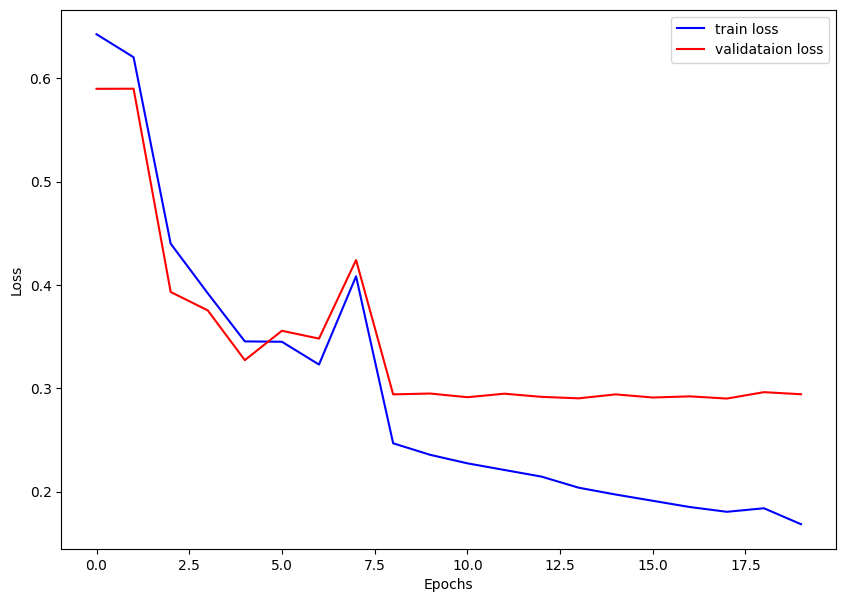

In [23]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 7))
plt.plot(train_losses, color='blue', linestyle='-', label='train loss')
plt.plot(val_losses, color='red', linestyle='-', label='validataion loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

#grad-cam

#Image1

In [24]:
import torch.nn as nn
import torch.optim as optim

# Load your pre-trained model
model = model
model.load_state_dict(checkpoint['state_dict'])

# Set the model to evaluation mode
model.eval()

BoneAgePredictor(
  (conv1): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1))
  (batch1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
  (batch2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
  (batch3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1))
  (batch4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv5): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1))
  (batch5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc1): Linear(in_features=4609, out_features=68, bias=True)
  (fc2): Linear(in_features=69, out_features=1, bias=True)
)

In [25]:
layer = model.conv5  # replace with your model's last convolutional layer
layer

Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1))

In [26]:
input1 = transform(Image.open(dataset_path('boneage_training_dataset/1377.png')).resize((256,256))).double()  # replace with your input
input1

tensor([[[0.9451, 0.9412, 0.7765,  ..., 0.2745, 0.2784, 0.2824],
         [0.9451, 0.9451, 0.7843,  ..., 0.2706, 0.2706, 0.2784],
         [0.9451, 0.9451, 0.7882,  ..., 0.2667, 0.2706, 0.2745],
         ...,
         [0.8784, 0.8824, 0.8745,  ..., 0.1765, 0.1804, 0.1804],
         [0.8824, 0.8824, 0.8863,  ..., 0.1843, 0.1843, 0.1843],
         [0.8863, 0.8745, 0.8824,  ..., 0.1922, 0.1882, 0.1882]]],
       dtype=torch.float64)

In [27]:
np.shape(input1)

torch.Size([1, 256, 256])

In [28]:
m1 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m1

tensor([1.], dtype=torch.float64)

In [29]:
input1 = input1.resize(1,1,256,256)
input1

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[[[0.9451, 0.9412, 0.7765,  ..., 0.2745, 0.2784, 0.2824],
          [0.9451, 0.9451, 0.7843,  ..., 0.2706, 0.2706, 0.2784],
          [0.9451, 0.9451, 0.7882,  ..., 0.2667, 0.2706, 0.2745],
          ...,
          [0.8784, 0.8824, 0.8745,  ..., 0.1765, 0.1804, 0.1804],
          [0.8824, 0.8824, 0.8863,  ..., 0.1843, 0.1843, 0.1843],
          [0.8863, 0.8745, 0.8824,  ..., 0.1922, 0.1882, 0.1882]]]],
       dtype=torch.float64)

In [30]:
m1 = m1.resize(1,1)
m1

tensor([[1.]], dtype=torch.float64)

In [31]:
output1 = model(input1, m1)
output1

tensor([[1.4838]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [32]:
features = []
def get_features_hook(model, input1, output1):
    features.append(output1)

hook_handle1 = model.conv5.register_forward_hook(get_features_hook)
output1 = model(input1,m1)
hook_handle1.remove()

feature_maps1 = features[0]
gradients1 = model.conv5.weight.grad

In [33]:
weights1 = torch.mean(gradients1, axis=(2, 3))
cam1 = torch.zeros(feature_maps1.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights1[0]):
    cam1 += w * feature_maps1[0, i, :, :]
cam1 = torch.nn.functional.relu(cam1)
cam1 = cam1.detach().numpy()

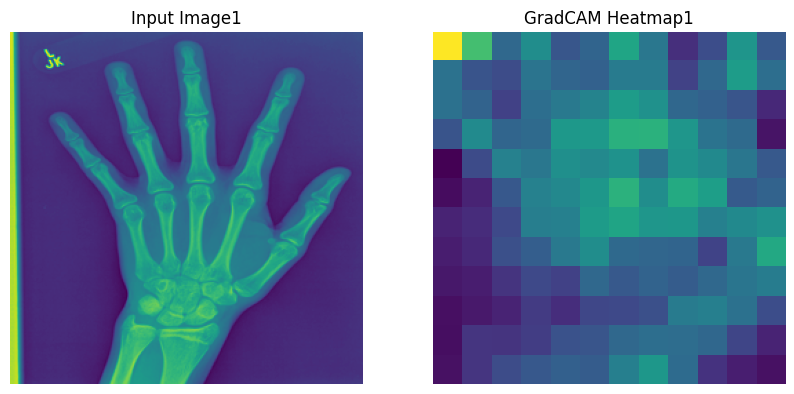

In [34]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input1.squeeze().detach().numpy())
ax[0].axis('off')
ax[0].set_title('Input Image1')
ax[1].imshow(cam1)#, cmap='jet')
ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap1')
plt.show()

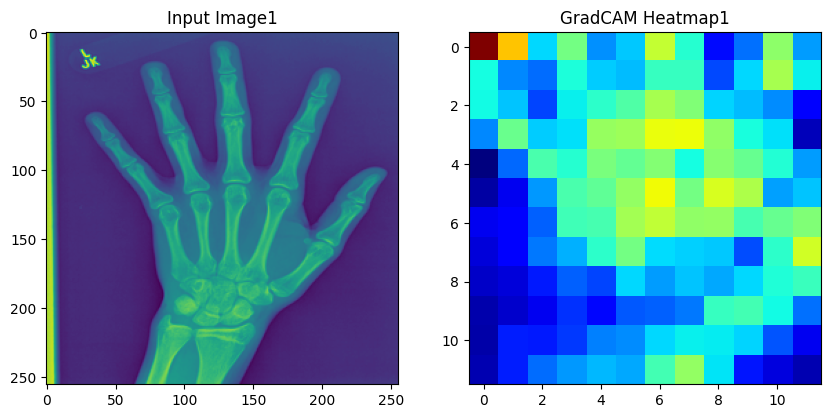

In [35]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input1.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image1')
ax[1].imshow(cam1, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap1')
plt.show()

In [36]:
input1.shape

torch.Size([1, 1, 256, 256])

In [37]:
cam1.shape

(12, 12)

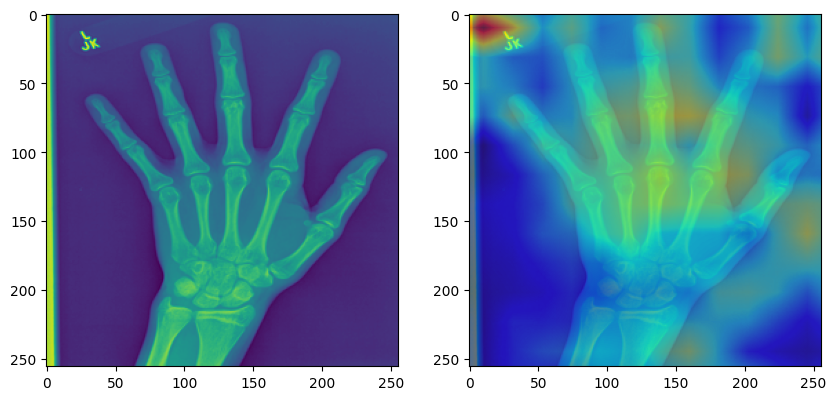

In [38]:
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].imshow(input1.squeeze().detach().numpy())
#ax[0].set_title("Video: " + sample_video + "Actual: " + y )

ax[1].imshow(input1.squeeze().detach().numpy())
ax[1].imshow(skimage.transform.resize(cam1, (input1.shape[2],input1.shape[3] )), alpha=0.5, cmap='jet')

#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

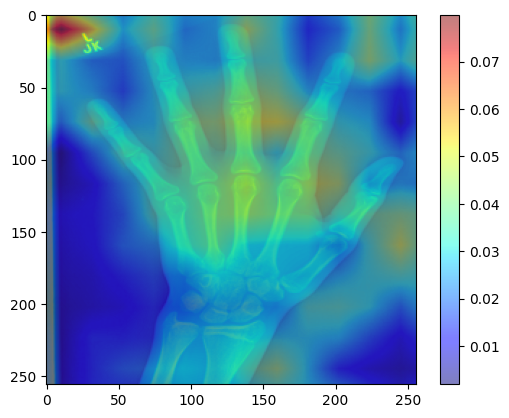

In [39]:
plt.imshow(input1.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam1, (input1.shape[2],input1.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image2

In [40]:
input2 = transform(Image.open(dataset_path('boneage_training_dataset/13305.png')).resize((256,256))).double()  # replace with your input
input2

tensor([[[0.0627, 0.0627, 0.0627,  ..., 0.0196, 0.0196, 0.0196],
         [0.0627, 0.0627, 0.0627,  ..., 0.0196, 0.0196, 0.0196],
         [0.0627, 0.0627, 0.0627,  ..., 0.0196, 0.0196, 0.0235],
         ...,
         [0.1294, 0.1255, 0.1255,  ..., 0.1059, 0.1059, 0.1059],
         [0.2196, 0.2157, 0.2196,  ..., 0.2157, 0.2157, 0.2196],
         [0.3961, 0.3922, 0.3922,  ..., 0.4196, 0.4235, 0.4196]]],
       dtype=torch.float64)

In [41]:
np.shape(input2)

torch.Size([1, 256, 256])

In [42]:
#input = input[None,:,:,:]
np.shape(input2)

torch.Size([1, 256, 256])

In [43]:
m2 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m2

tensor([1.], dtype=torch.float64)

In [44]:
input2 = input2.resize(1,1,256,256)
input2

tensor([[[[0.0627, 0.0627, 0.0627,  ..., 0.0196, 0.0196, 0.0196],
          [0.0627, 0.0627, 0.0627,  ..., 0.0196, 0.0196, 0.0196],
          [0.0627, 0.0627, 0.0627,  ..., 0.0196, 0.0196, 0.0235],
          ...,
          [0.1294, 0.1255, 0.1255,  ..., 0.1059, 0.1059, 0.1059],
          [0.2196, 0.2157, 0.2196,  ..., 0.2157, 0.2157, 0.2196],
          [0.3961, 0.3922, 0.3922,  ..., 0.4196, 0.4235, 0.4196]]]],
       dtype=torch.float64)

In [45]:
m2 = m2.resize(1,1)
m2

tensor([[1.]], dtype=torch.float64)

In [46]:
output2 = model(input2, m2)
output2

tensor([[2.1612]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [47]:
features = []
def get_features_hook(model, input2, output2):
    features.append(output2)

hook_handle2 = model.conv5.register_forward_hook(get_features_hook)
output2 = model(input2,m2)
hook_handle2.remove()

feature_maps2 = features[0]
gradients2 = model.conv5.weight.grad

In [48]:
weights2 = torch.mean(gradients2, axis=(2, 3))
cam2 = torch.zeros(feature_maps2.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights2[0]):
    cam2 += w * feature_maps2[0, i, :, :]
cam2 = torch.nn.functional.relu(cam2)
cam2 = cam2.detach().numpy()

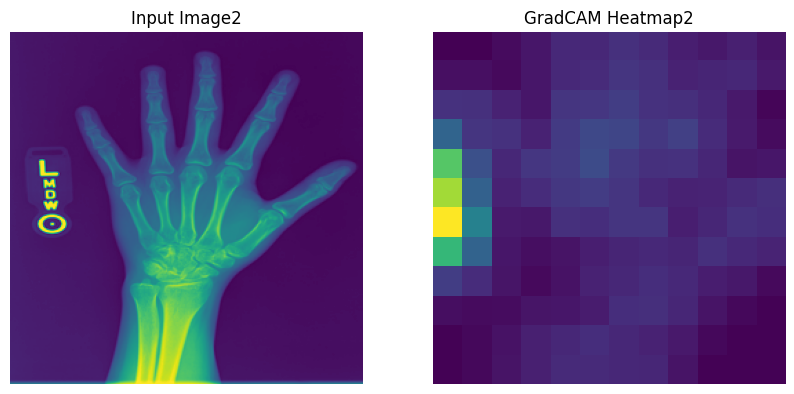

In [49]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input2.squeeze().detach().numpy())
ax[0].axis('off')
ax[0].set_title('Input Image2')
ax[1].imshow(cam2)#, cmap='jet')
ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap2')
plt.show()

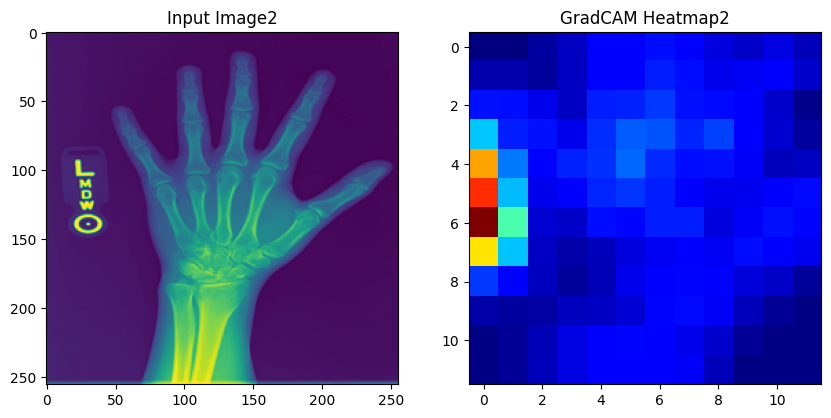

In [50]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input2.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image2')
ax[1].imshow(cam2, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap2')
plt.show()

In [51]:
input2.shape

torch.Size([1, 1, 256, 256])

In [52]:
cam2.shape

(12, 12)

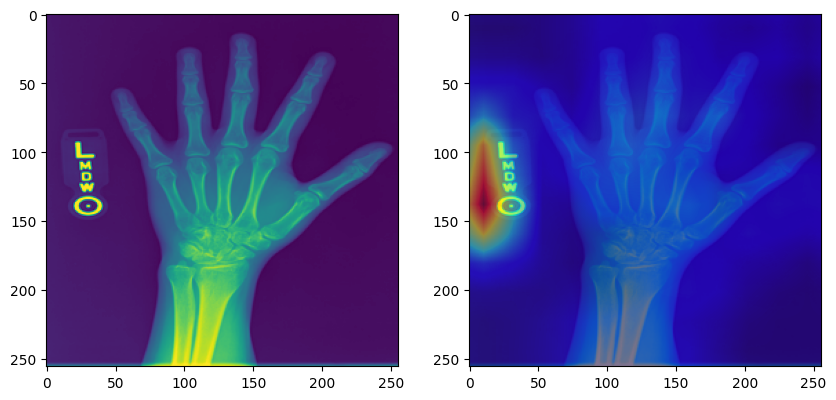

In [53]:
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].imshow(input2.squeeze().detach().numpy())
#ax[0].set_title("Video: " + sample_video + "Actual: " + y )

ax[1].imshow(input2.squeeze().detach().numpy())
ax[1].imshow(skimage.transform.resize(cam2, (input2.shape[2],input2.shape[3] )), alpha=0.5, cmap='jet')

#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

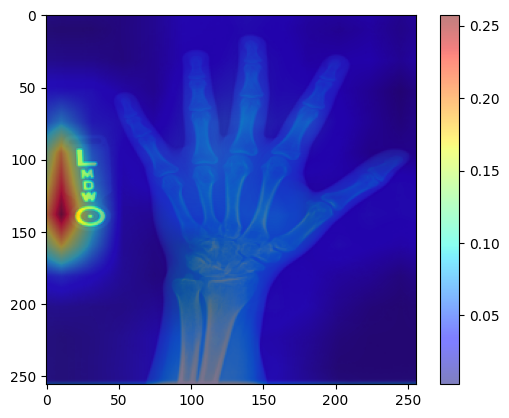

In [54]:
plt.imshow(input2.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam2, (input2.shape[2],input2.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image3

In [55]:
input3 = transform(Image.open(dataset_path('boneage_training_dataset/12930.png')).resize((256,256))).double()  # replace with your input
input3

tensor([[[0.0510, 0.0510, 0.0510,  ..., 0.0510, 0.0471, 0.0510],
         [0.0510, 0.0510, 0.0510,  ..., 0.0471, 0.0471, 0.0471],
         [0.0510, 0.0510, 0.0510,  ..., 0.0471, 0.0471, 0.0471],
         ...,
         [0.0824, 0.0824, 0.0784,  ..., 0.0941, 0.0902, 0.0941],
         [0.0784, 0.0784, 0.0784,  ..., 0.0863, 0.0863, 0.0863],
         [0.1333, 0.1333, 0.1333,  ..., 0.0980, 0.0980, 0.0980]]],
       dtype=torch.float64)

In [56]:
np.shape(input3)

torch.Size([1, 256, 256])

In [57]:
#input = input[None,:,:,:]
np.shape(input3)

torch.Size([1, 256, 256])

In [58]:
m3 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m3

tensor([1.], dtype=torch.float64)

In [59]:
input3 = input3.resize(1,1,256,256)
input3

tensor([[[[0.0510, 0.0510, 0.0510,  ..., 0.0510, 0.0471, 0.0510],
          [0.0510, 0.0510, 0.0510,  ..., 0.0471, 0.0471, 0.0471],
          [0.0510, 0.0510, 0.0510,  ..., 0.0471, 0.0471, 0.0471],
          ...,
          [0.0824, 0.0824, 0.0784,  ..., 0.0941, 0.0902, 0.0941],
          [0.0784, 0.0784, 0.0784,  ..., 0.0863, 0.0863, 0.0863],
          [0.1333, 0.1333, 0.1333,  ..., 0.0980, 0.0980, 0.0980]]]],
       dtype=torch.float64)

In [60]:
m3 = m3.resize(1,1)
m3

tensor([[1.]], dtype=torch.float64)

In [61]:
output3 = model(input3, m3)
output3

tensor([[0.3467]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [62]:
features = []
def get_features_hook(model, input3, output3):
    features.append(output3)

hook_handle3 = model.conv5.register_forward_hook(get_features_hook)
output3 = model(input3,m3)
hook_handle3.remove()

feature_maps3= features[0]
gradients3 = model.conv5.weight.grad

In [63]:
weights3 = torch.mean(gradients3, axis=(2, 3))
cam3 = torch.zeros(feature_maps3.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights3[0]):
    cam3 += w * feature_maps3[0, i, :, :]
cam3 = torch.nn.functional.relu(cam3)
cam3 = cam3.detach().numpy()

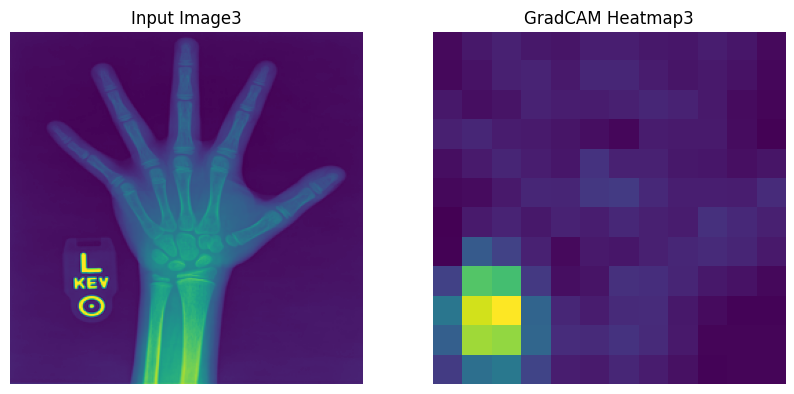

In [64]:
ig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input3.squeeze().detach().numpy())
ax[0].axis('off')
ax[0].set_title('Input Image3')
ax[1].imshow(cam3)#, cmap='jet')
ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap3')
plt.show()

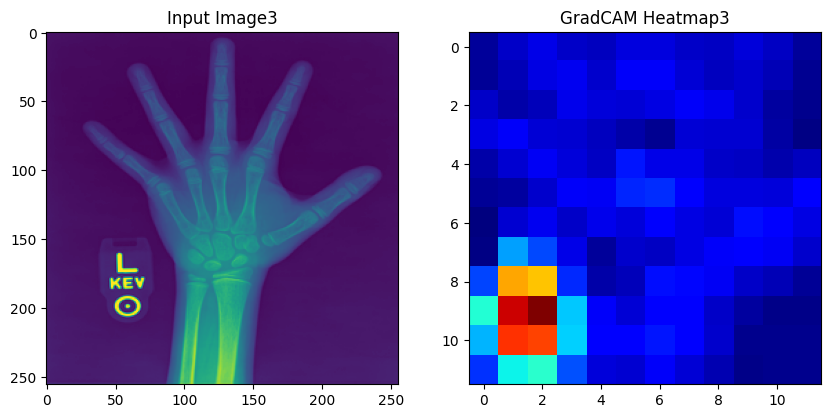

In [65]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input3.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image3')
ax[1].imshow(cam3, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap3')
plt.show()


In [66]:
input3.shape

torch.Size([1, 1, 256, 256])

In [67]:
cam3.shape

(12, 12)

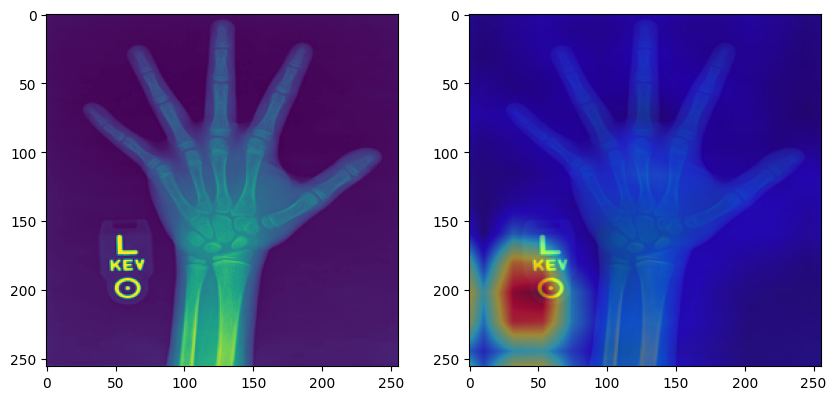

In [68]:
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].imshow(input3.squeeze().detach().numpy())
#ax[0].set_title("Video: " + sample_video + "Actual: " + y )

ax[1].imshow(input3.squeeze().detach().numpy())
ax[1].imshow(skimage.transform.resize(cam3, (input3.shape[2],input3.shape[3] )), alpha=0.5, cmap='jet')

#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

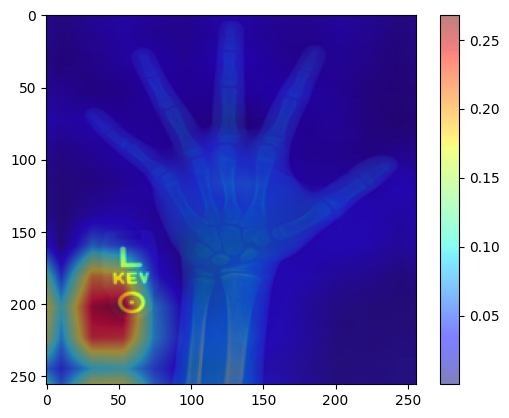

In [69]:
plt.imshow(input3.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam3, (input3.shape[2],input3.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image4

In [70]:
input4 = transform(Image.open(dataset_path('boneage_training_dataset/12496.png')).resize((256,256))).double()  # replace with your input
input4

tensor([[[0.2902, 0.2078, 0.2118,  ..., 0.4314, 0.4667, 0.5294],
         [0.2039, 0.1294, 0.1333,  ..., 0.1804, 0.2235, 0.2980],
         [0.2000, 0.1216, 0.1255,  ..., 0.0902, 0.1451, 0.2392],
         ...,
         [0.2118, 0.2039, 0.2039,  ..., 0.2000, 0.3098, 0.4627],
         [0.4118, 0.4039, 0.3961,  ..., 0.2000, 0.3098, 0.4627],
         [0.7333, 0.7216, 0.7137,  ..., 0.2353, 0.3294, 0.4706]]],
       dtype=torch.float64)

In [71]:
np.shape(input4)

torch.Size([1, 256, 256])

In [72]:
#input = input[None,:,:,:]
np.shape(input4)

torch.Size([1, 256, 256])

In [73]:
m4 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m4

tensor([1.], dtype=torch.float64)

In [74]:
input4 = input4.resize(1,1,256,256)
input4

tensor([[[[0.2902, 0.2078, 0.2118,  ..., 0.4314, 0.4667, 0.5294],
          [0.2039, 0.1294, 0.1333,  ..., 0.1804, 0.2235, 0.2980],
          [0.2000, 0.1216, 0.1255,  ..., 0.0902, 0.1451, 0.2392],
          ...,
          [0.2118, 0.2039, 0.2039,  ..., 0.2000, 0.3098, 0.4627],
          [0.4118, 0.4039, 0.3961,  ..., 0.2000, 0.3098, 0.4627],
          [0.7333, 0.7216, 0.7137,  ..., 0.2353, 0.3294, 0.4706]]]],
       dtype=torch.float64)

In [75]:
m4 = m4.resize(1,1)
m4

tensor([[1.]], dtype=torch.float64)

In [76]:
output4 = model(input4, m4)
output4

tensor([[-0.0913]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [77]:
features = []
def get_features_hook(model, input4, output4):
    features.append(output4)

hook_handle4 = model.conv5.register_forward_hook(get_features_hook)
output4 = model(input4,m4)
hook_handle4.remove()

feature_maps4 = features[0]
gradients4 = model.conv5.weight.grad

In [78]:
weights4 = torch.mean(gradients4, axis=(2, 3))
cam4 = torch.zeros(feature_maps4.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights4[0]):
    cam4 += w * feature_maps4[0, i, :, :]
cam4 = torch.nn.functional.relu(cam4)
cam4 = cam4.detach().numpy()

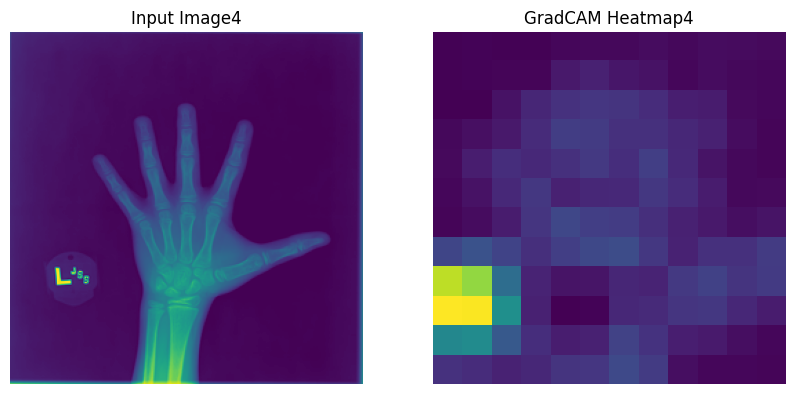

In [79]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input4.squeeze().detach().numpy())
ax[0].axis('off')
ax[0].set_title('Input Image4')
ax[1].imshow(cam4)#, cmap='jet')
ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap4')
plt.show()

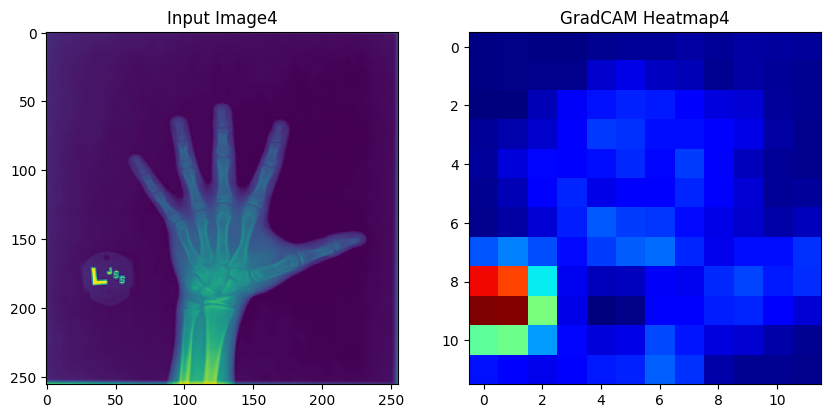

In [80]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input4.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image4')
ax[1].imshow(cam4, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap4')
plt.show()

In [81]:
input4.shape

torch.Size([1, 1, 256, 256])

In [82]:
cam4.shape

(12, 12)

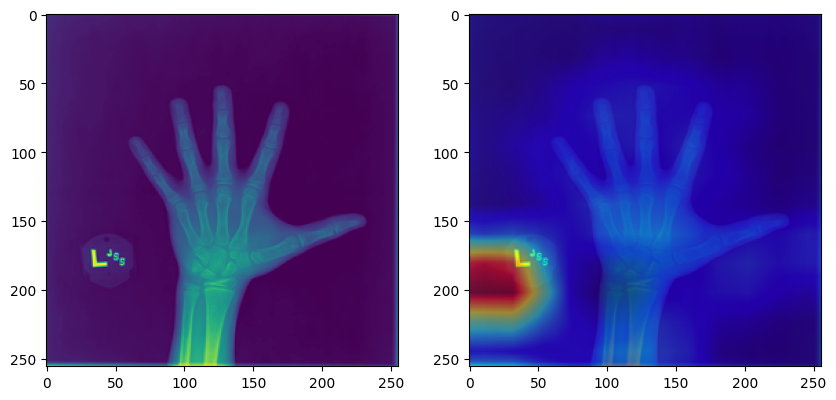

In [83]:
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].imshow(input4.squeeze().detach().numpy())
#ax[0].set_title("Video: " + sample_video + "Actual: " + y )

ax[1].imshow(input4.squeeze().detach().numpy())
ax[1].imshow(skimage.transform.resize(cam4, (input4.shape[2],input4.shape[3] )), alpha=0.5, cmap='jet')

#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

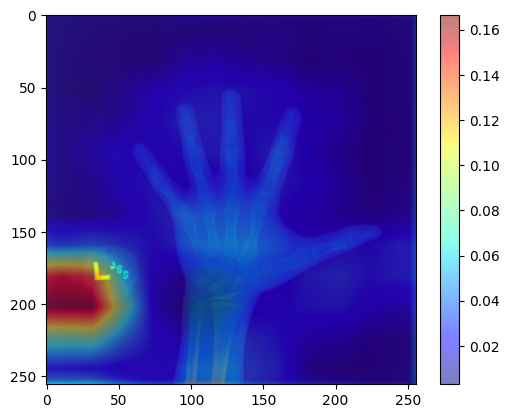

In [84]:
plt.imshow(input4.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam4, (input4.shape[2],input4.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image5

In [85]:
input5 = transform(Image.open(dataset_path('boneage_training_dataset/10157.png')).resize((256,256))).double()  # replace with your input
input5

tensor([[[0.0588, 0.0549, 0.0510,  ..., 0.0549, 0.0549, 0.0549],
         [0.0549, 0.0510, 0.0510,  ..., 0.0510, 0.0549, 0.0510],
         [0.0510, 0.0510, 0.0510,  ..., 0.0510, 0.0510, 0.0510],
         ...,
         [0.1098, 0.1059, 0.1059,  ..., 0.0941, 0.0941, 0.0941],
         [0.1098, 0.1059, 0.1059,  ..., 0.0980, 0.0980, 0.1020],
         [0.1098, 0.1098, 0.1098,  ..., 0.1020, 0.1020, 0.1020]]],
       dtype=torch.float64)

In [86]:
np.shape(input5)

torch.Size([1, 256, 256])

In [87]:
#input = input[None,:,:,:]
np.shape(input5)

torch.Size([1, 256, 256])

In [88]:
m5 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m5

tensor([1.], dtype=torch.float64)

In [89]:
input5 = input5.resize(1,1,256,256)
input5

tensor([[[[0.0588, 0.0549, 0.0510,  ..., 0.0549, 0.0549, 0.0549],
          [0.0549, 0.0510, 0.0510,  ..., 0.0510, 0.0549, 0.0510],
          [0.0510, 0.0510, 0.0510,  ..., 0.0510, 0.0510, 0.0510],
          ...,
          [0.1098, 0.1059, 0.1059,  ..., 0.0941, 0.0941, 0.0941],
          [0.1098, 0.1059, 0.1059,  ..., 0.0980, 0.0980, 0.1020],
          [0.1098, 0.1098, 0.1098,  ..., 0.1020, 0.1020, 0.1020]]]],
       dtype=torch.float64)

In [90]:
m5 = m5.resize(1,1)
m5

tensor([[1.]], dtype=torch.float64)

In [91]:
output5 = model(input5, m5)
output5

tensor([[1.6467]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [92]:
features = []
def get_features_hook(model, input5, output5):
    features.append(output5)

hook_handle5 = model.conv5.register_forward_hook(get_features_hook)
output5 = model(input5,m5)
hook_handle5.remove()

feature_maps5 = features[0]
gradients5 = model.conv5.weight.grad

In [93]:
weights5 = torch.mean(gradients5, axis=(2, 3))
cam5 = torch.zeros(feature_maps5.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights5[0]):
    cam5 += w * feature_maps5[0, i, :, :]
cam5 = torch.nn.functional.relu(cam5)
cam5 = cam5.detach().numpy()

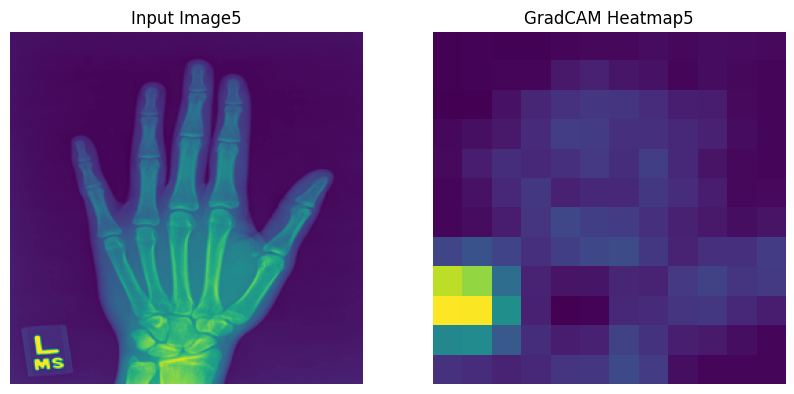

In [94]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input5.squeeze().detach().numpy())
ax[0].axis('off')
ax[0].set_title('Input Image5')
ax[1].imshow(cam4)#, cmap='jet')
ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap5')
plt.show()

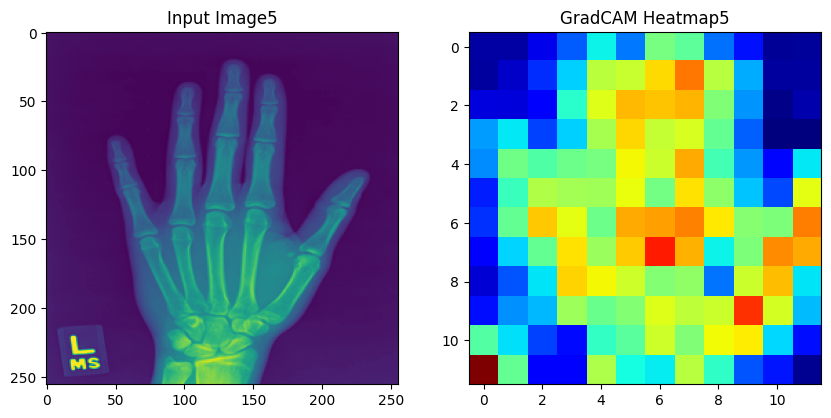

In [95]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input5.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image5')
ax[1].imshow(cam5, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap5')
plt.show()

In [96]:
input5.shape

torch.Size([1, 1, 256, 256])

In [97]:
cam5.shape

(12, 12)

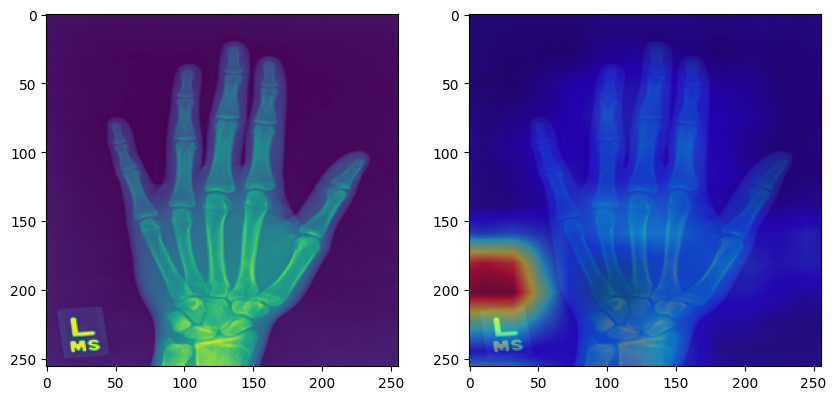

In [98]:
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].imshow(input5.squeeze().detach().numpy())
#ax[0].set_title("Video: " + sample_video + "Actual: " + y )

ax[1].imshow(input5.squeeze().detach().numpy())
ax[1].imshow(skimage.transform.resize(cam4, (input5.shape[2],input5.shape[3] )), alpha=0.5, cmap='jet')

#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

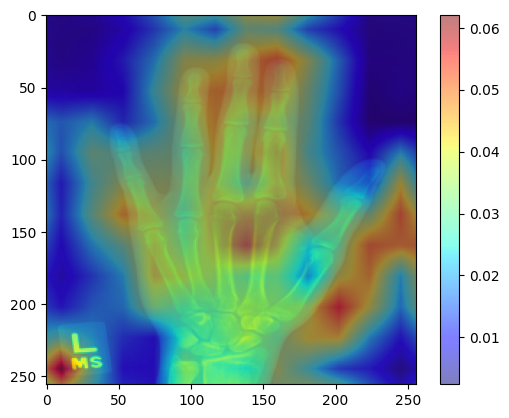

In [99]:
plt.imshow(input5.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam5, (input5.shape[2],input5.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image6

In [100]:
input6 = transform(Image.open(dataset_path('boneage_training_dataset/9567.png')).resize((256,256))).double()  # replace with your input
input6

tensor([[[0.7294, 0.8588, 0.8196,  ..., 0.0980, 0.1137, 0.0824],
         [0.8667, 0.9647, 0.7804,  ..., 0.6196, 0.7490, 0.5725],
         [0.8196, 0.7647, 0.5725,  ..., 0.5059, 0.6039, 0.4745],
         ...,
         [0.3961, 0.6157, 0.4863,  ..., 0.5333, 0.4196, 0.0000],
         [0.4157, 0.6706, 0.5490,  ..., 0.6235, 0.4941, 0.0000],
         [0.3686, 0.6235, 0.5176,  ..., 0.3137, 0.2471, 0.0000]]],
       dtype=torch.float64)

In [101]:
np.shape(input6)

torch.Size([1, 256, 256])

In [102]:
#input = input[None,:,:,:]
np.shape(input6)

torch.Size([1, 256, 256])

In [103]:
m6 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m6

tensor([1.], dtype=torch.float64)

In [104]:
input6 = input6.resize(1,1,256,256)
input6

tensor([[[[0.7294, 0.8588, 0.8196,  ..., 0.0980, 0.1137, 0.0824],
          [0.8667, 0.9647, 0.7804,  ..., 0.6196, 0.7490, 0.5725],
          [0.8196, 0.7647, 0.5725,  ..., 0.5059, 0.6039, 0.4745],
          ...,
          [0.3961, 0.6157, 0.4863,  ..., 0.5333, 0.4196, 0.0000],
          [0.4157, 0.6706, 0.5490,  ..., 0.6235, 0.4941, 0.0000],
          [0.3686, 0.6235, 0.5176,  ..., 0.3137, 0.2471, 0.0000]]]],
       dtype=torch.float64)

In [105]:
m6 = m6.resize(1,1)
m6

tensor([[1.]], dtype=torch.float64)

In [106]:
output6= model(input6, m6)
output6

tensor([[-0.5226]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [107]:
features = []
def get_features_hook(model, input6, output6):
    features.append(output6)

hook_handle6 = model.conv5.register_forward_hook(get_features_hook)
output6 = model(input6,m6)
hook_handle6.remove()

feature_maps6 = features[0]
gradients6 = model.conv5.weight.grad

In [108]:
weights6 = torch.mean(gradients6, axis=(2, 3))
cam6 = torch.zeros(feature_maps6.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights6[0]):
    cam6 += w * feature_maps6[0, i, :, :]
cam6 = torch.nn.functional.relu(cam6)
cam6 = cam6.detach().numpy()

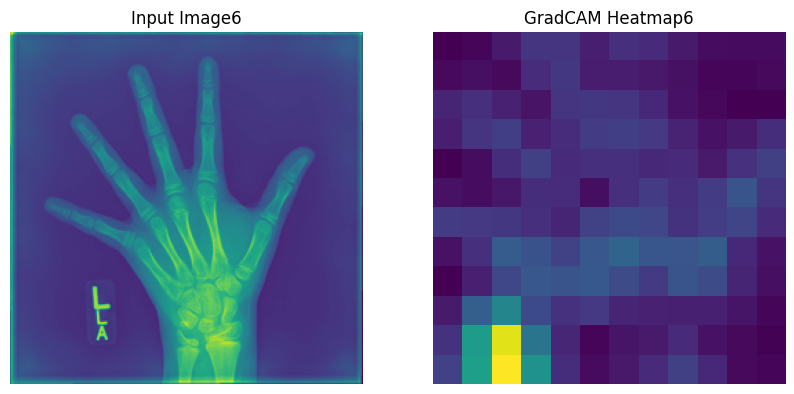

In [109]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input6.squeeze().detach().numpy())
ax[0].axis('off')
ax[0].set_title('Input Image6')
ax[1].imshow(cam6)#, cmap='jet')
ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap6')
plt.show()

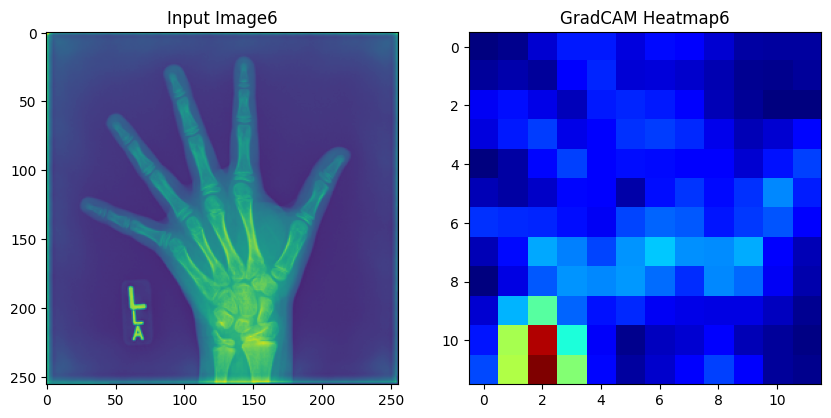

In [110]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input6.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image6')
ax[1].imshow(cam6, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap6')
plt.show()

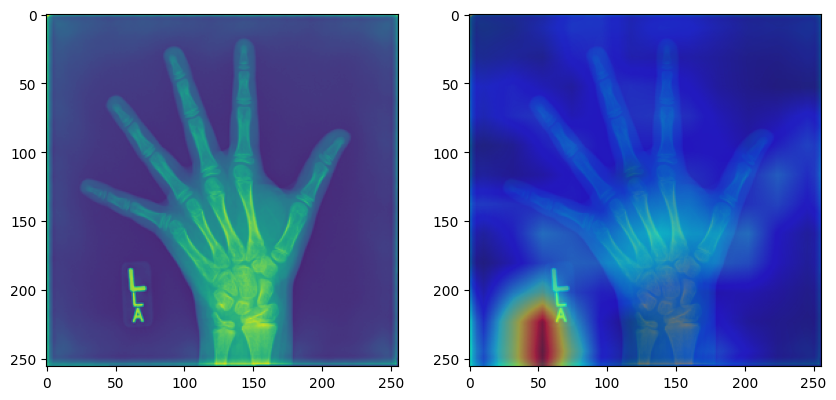

In [111]:
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].imshow(input6.squeeze().detach().numpy())
#ax[0].set_title("Video: " + sample_video + "Actual: " + y )

ax[1].imshow(input6.squeeze().detach().numpy())
ax[1].imshow(skimage.transform.resize(cam6, (input6.shape[2],input6.shape[3] )), alpha=0.5, cmap='jet')

#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

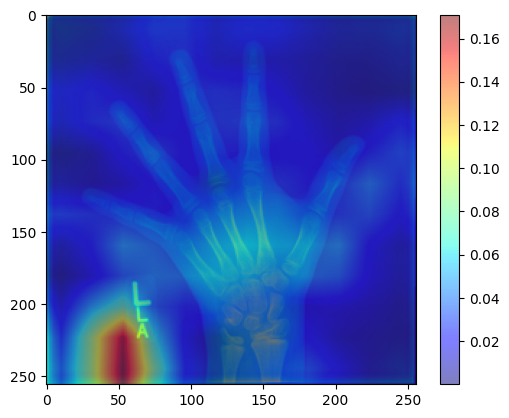

In [112]:
plt.imshow(input6.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam6, (input6.shape[2],input6.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap=6'jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image7

In [113]:
input7 = transform(Image.open(dataset_path('boneage_training_dataset/9924.png')).resize((256,256))).double()  # replace with your input
input7

tensor([[[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9647,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9451, 0.8431,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [0.1176, 0.0627, 0.0549,  ..., 0.0588, 0.0588, 0.0588],
         [0.1176, 0.0627, 0.0588,  ..., 0.0588, 0.0588, 0.0588],
         [0.1216, 0.0667, 0.0588,  ..., 0.0588, 0.0588, 0.0627]]],
       dtype=torch.float64)

In [114]:
np.shape(input7)

torch.Size([1, 256, 256])

In [115]:
#input = input[None,:,:,:]
np.shape(input7)

torch.Size([1, 256, 256])

In [116]:
m7 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m7

tensor([1.], dtype=torch.float64)

In [117]:
input7 = input7.resize(1,1,256,256)
input7

tensor([[[[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
          [1.0000, 0.9961, 0.9647,  ..., 1.0000, 1.0000, 1.0000],
          [1.0000, 0.9451, 0.8431,  ..., 1.0000, 1.0000, 1.0000],
          ...,
          [0.1176, 0.0627, 0.0549,  ..., 0.0588, 0.0588, 0.0588],
          [0.1176, 0.0627, 0.0588,  ..., 0.0588, 0.0588, 0.0588],
          [0.1216, 0.0667, 0.0588,  ..., 0.0588, 0.0588, 0.0627]]]],
       dtype=torch.float64)

In [118]:
m7 = m7.resize(1,1)
m7

tensor([[1.]], dtype=torch.float64)

In [119]:
output7= model(input7, m7)
output7

tensor([[0.2682]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [120]:
features = []
def get_features_hook(model, input7, output7):
    features.append(output7)

hook_handle7 = model.conv5.register_forward_hook(get_features_hook)
output7 = model(input7,m7)
hook_handle7.remove()

feature_maps7 = features[0]
gradients7 = model.conv5.weight.grad

In [121]:
weights7 = torch.mean(gradients7, axis=(2, 3))
cam7 = torch.zeros(feature_maps7.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights7[0]):
    cam7 += w * feature_maps7[0, i, :, :]
cam7 = torch.nn.functional.relu(cam7)
cam7 = cam7.detach().numpy()

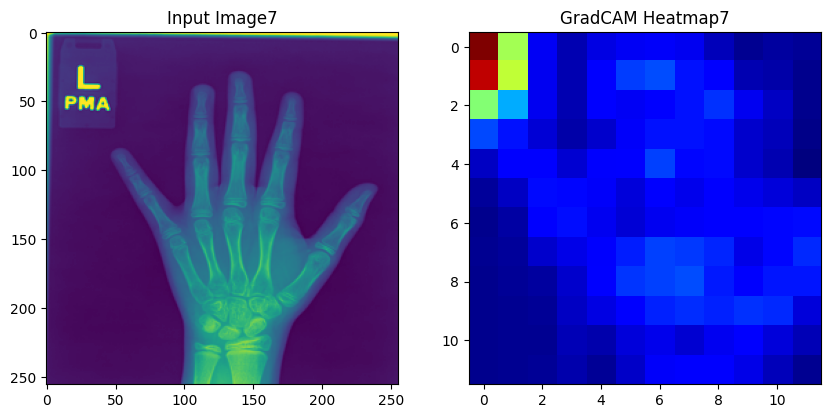

In [122]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input7.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image7')
ax[1].imshow(cam7, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap7')
plt.show()

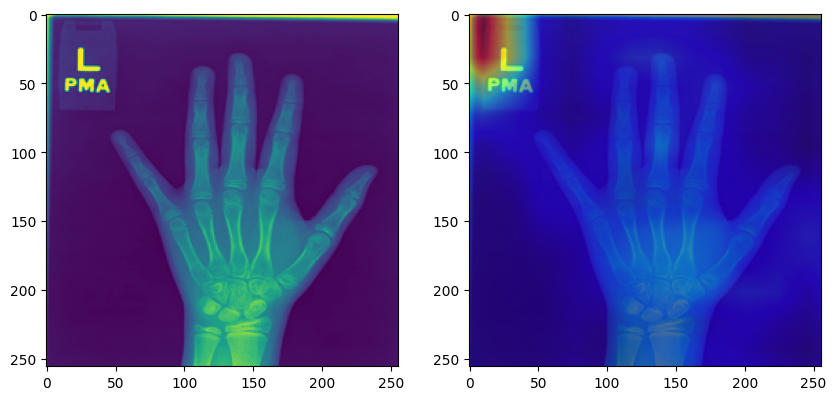

In [123]:
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].imshow(input7.squeeze().detach().numpy())
#ax[0].set_title("Video: " + sample_video + "Actual: " + y )

ax[1].imshow(input7.squeeze().detach().numpy())
ax[1].imshow(skimage.transform.resize(cam7, (input7.shape[2],input7.shape[3] )), alpha=0.5, cmap='jet')

#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

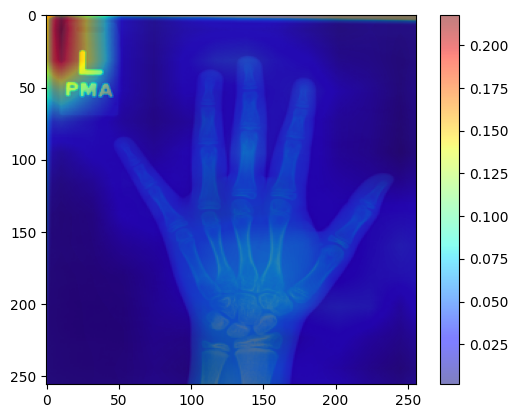

In [124]:
plt.imshow(input7.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam7, (input7.shape[2],input7.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap=6'jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image8

In [125]:
input8 = transform(Image.open(dataset_path('boneage_training_dataset/9153.png')).resize((256,256))).double()  # replace with your input
input8

tensor([[[0.0431, 0.0431, 0.0431,  ..., 0.0431, 0.0431, 0.0431],
         [0.0431, 0.0431, 0.0431,  ..., 0.0392, 0.0392, 0.0392],
         [0.0431, 0.0431, 0.0431,  ..., 0.0392, 0.0392, 0.0392],
         ...,
         [0.0784, 0.0745, 0.0745,  ..., 0.0941, 0.0941, 0.0980],
         [0.0745, 0.0745, 0.0745,  ..., 0.0980, 0.0980, 0.1020],
         [0.1255, 0.1255, 0.1216,  ..., 0.1020, 0.1020, 0.1059]]],
       dtype=torch.float64)

In [126]:
np.shape(input8)

torch.Size([1, 256, 256])

In [127]:
#input = input[None,:,:,:]
np.shape(input8)

torch.Size([1, 256, 256])

In [128]:
m8 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m8

tensor([1.], dtype=torch.float64)

In [129]:
input8 = input8.resize(1,1,256,256)
input8

tensor([[[[0.0431, 0.0431, 0.0431,  ..., 0.0431, 0.0431, 0.0431],
          [0.0431, 0.0431, 0.0431,  ..., 0.0392, 0.0392, 0.0392],
          [0.0431, 0.0431, 0.0431,  ..., 0.0392, 0.0392, 0.0392],
          ...,
          [0.0784, 0.0745, 0.0745,  ..., 0.0941, 0.0941, 0.0980],
          [0.0745, 0.0745, 0.0745,  ..., 0.0980, 0.0980, 0.1020],
          [0.1255, 0.1255, 0.1216,  ..., 0.1020, 0.1020, 0.1059]]]],
       dtype=torch.float64)

In [130]:
m8 = m8.resize(1,1)
m8

tensor([[1.]], dtype=torch.float64)

In [131]:
output8= model(input8, m8)
output8

tensor([[0.5004]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [132]:
features = []
def get_features_hook(model, input8, output8):
    features.append(output8)

hook_handle8 = model.conv5.register_forward_hook(get_features_hook)
output8 = model(input8,m8)
hook_handle8.remove()

feature_maps8 = features[0]
gradients8 = model.conv5.weight.grad

In [133]:
weights8 = torch.mean(gradients8, axis=(2, 3))
cam8 = torch.zeros(feature_maps8.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights8[0]):
    cam8 += w * feature_maps8[0, i, :, :]
cam8 = torch.nn.functional.relu(cam8)
cam8 = cam8.detach().numpy()

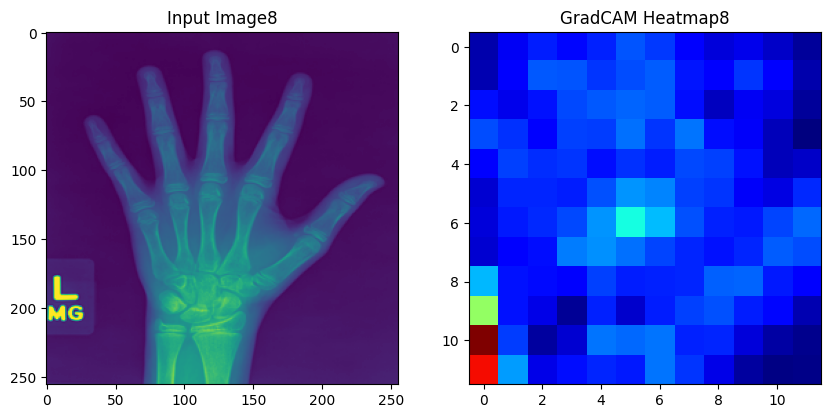

In [134]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input8.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image8')
ax[1].imshow(cam8, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap8')
plt.show()

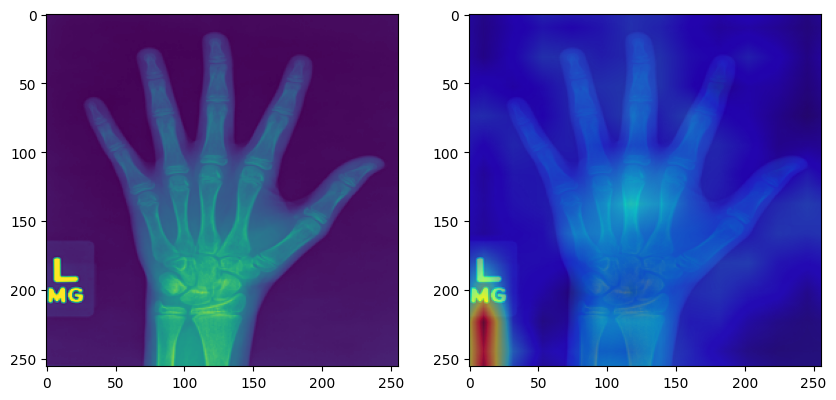

In [135]:
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].imshow(input8.squeeze().detach().numpy())
#ax[0].set_title("Video: " + sample_video + "Actual: " + y )

ax[1].imshow(input8.squeeze().detach().numpy())
ax[1].imshow(skimage.transform.resize(cam8, (input8.shape[2],input8.shape[3] )), alpha=0.5, cmap='jet')

#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

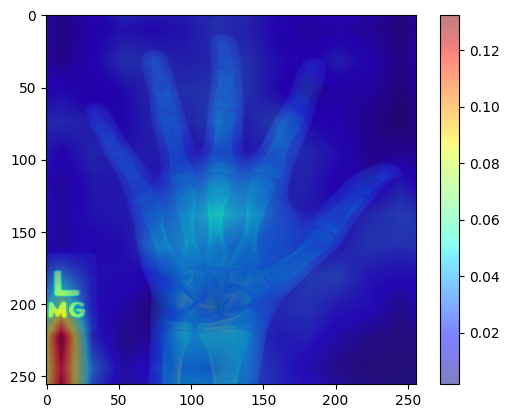

In [136]:
plt.imshow(input8.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam8, (input8.shape[2],input8.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap=6'jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#image9

In [137]:
input9 = transform(Image.open(dataset_path('boneage_training_dataset/9856.png')).resize((256,256))).double()  # replace with your input
input9

tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]], dtype=torch.float64)

In [138]:
np.shape(input9)

torch.Size([1, 256, 256])

In [139]:
#input = input[None,:,:,:]
np.shape(input9)

torch.Size([1, 256, 256])

In [140]:
m9 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m9

tensor([1.], dtype=torch.float64)

In [141]:
input9 = input9.resize(1,1,256,256)
input9

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]]], dtype=torch.float64)

In [142]:
m9 = m9.resize(1,1)
m9

tensor([[1.]], dtype=torch.float64)

In [143]:
output9= model(input9, m9)
output9

tensor([[-0.2132]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [144]:
features = []
def get_features_hook(model, input9, output9):
    features.append(output9)

hook_handle9 = model.conv5.register_forward_hook(get_features_hook)
output9 = model(input9,m9)
hook_handle9.remove()

feature_maps9 = features[0]
gradients9 = model.conv5.weight.grad

In [145]:
weights9 = torch.mean(gradients9, axis=(2, 3))
cam9 = torch.zeros(feature_maps9.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights9[0]):
    cam9 += w * feature_maps9[0, i, :, :]
cam9 = torch.nn.functional.relu(cam9)
cam9 = cam9.detach().numpy()

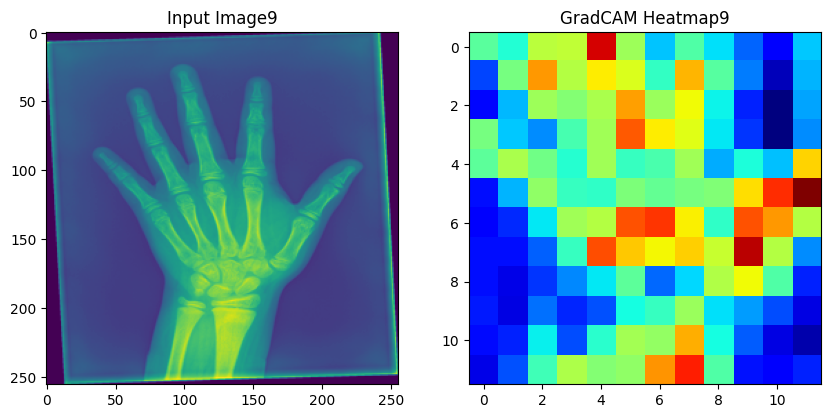

In [146]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input9.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image9')
ax[1].imshow(cam9, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap9')
plt.show()

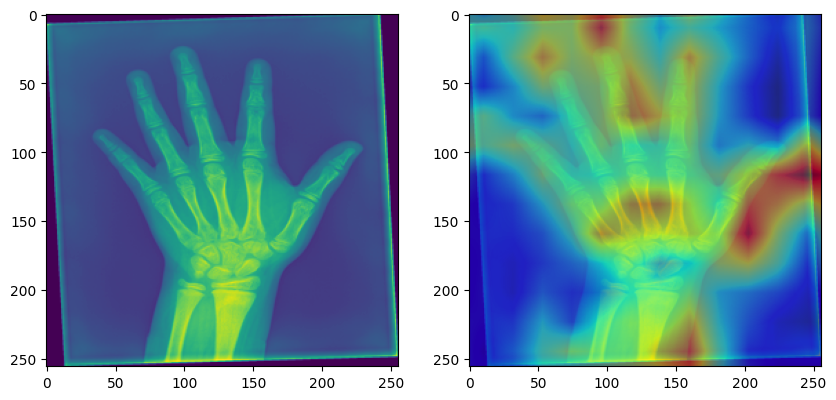

In [147]:
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].imshow(input9.squeeze().detach().numpy())
#ax[0].set_title("Video: " + sample_video + "Actual: " + y )

ax[1].imshow(input9.squeeze().detach().numpy())
ax[1].imshow(skimage.transform.resize(cam9, (input9.shape[2],input9.shape[3] )), alpha=0.5, cmap='jet')

#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

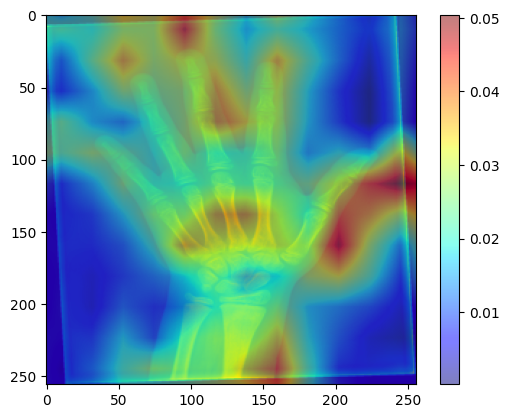

In [148]:
plt.imshow(input9.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam9, (input9.shape[2],input8.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap=6'jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image10

In [149]:
input10 = transform(Image.open(dataset_path('boneage_training_dataset/9551.png')).resize((256,256))).double()  # replace with your input
input10

tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]], dtype=torch.float64)

In [150]:
np.shape(input10)

torch.Size([1, 256, 256])

In [151]:
#input = input[None,:,:,:]
np.shape(input10)

torch.Size([1, 256, 256])

In [152]:
m10 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m10

tensor([1.], dtype=torch.float64)

In [153]:
input10 = input10.resize(1,1,256,256)
input10

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]]], dtype=torch.float64)

In [154]:
m10 = m10.resize(1,1)
m10

tensor([[1.]], dtype=torch.float64)

In [155]:
output10= model(input10, m10)
output10

tensor([[0.4294]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [156]:
features = []
def get_features_hook(model, input10, output10):
    features.append(output10)

hook_handle10 = model.conv5.register_forward_hook(get_features_hook)
output10 = model(input10,m10)
hook_handle10.remove()

feature_maps10 = features[0]
gradients10 = model.conv5.weight.grad

In [157]:
weights10 = torch.mean(gradients10, axis=(2, 3))
cam10 = torch.zeros(feature_maps10.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights10[0]):
    cam10 += w * feature_maps10[0, i, :, :]
cam10 = torch.nn.functional.relu(cam10)
cam10 = cam10.detach().numpy()

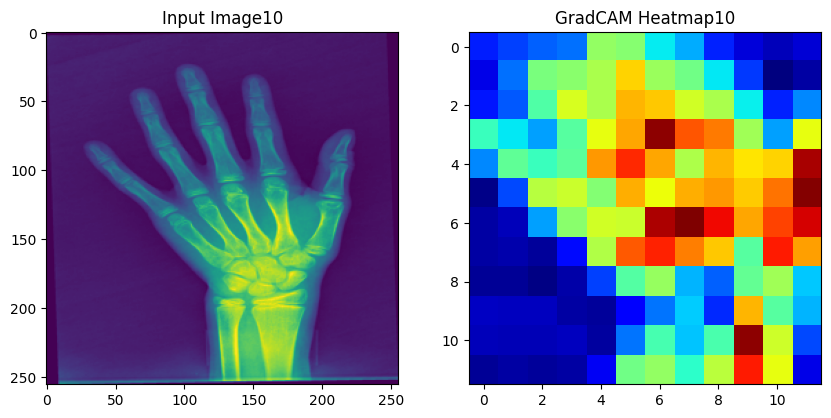

In [158]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input10.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image10')
ax[1].imshow(cam10, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap10')
plt.show()

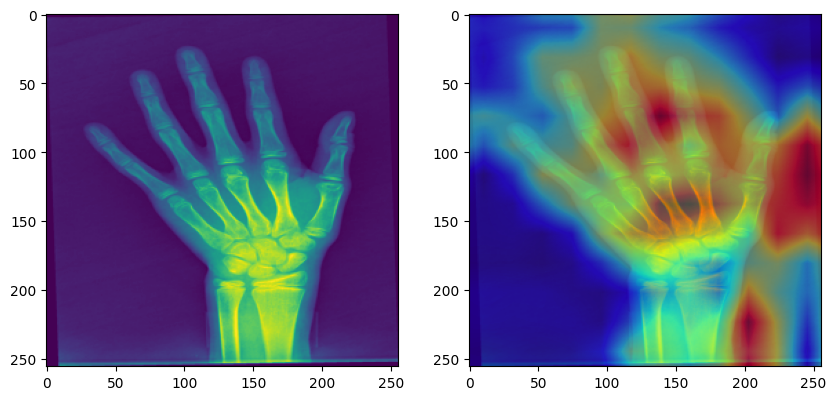

In [159]:
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].imshow(input10.squeeze().detach().numpy())
#ax[0].set_title("Video: " + sample_video + "Actual: " + y )

ax[1].imshow(input10.squeeze().detach().numpy())
ax[1].imshow(skimage.transform.resize(cam10, (input10.shape[2],input10.shape[3] )), alpha=0.5, cmap='jet')

#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

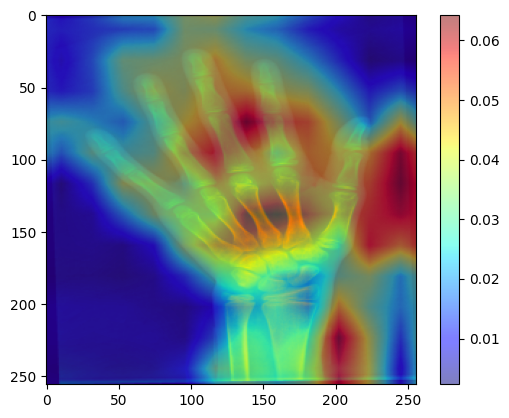

In [160]:
plt.imshow(input10.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam10, (input10.shape[2],input10.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap=6'jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image11

In [161]:
input11 = transform(Image.open(dataset_path('boneage_training_dataset/9774.png')).resize((256,256))).double()  # replace with your input
input11

tensor([[[0.8902, 0.8902, 0.8471,  ..., 0.1765, 0.1843, 0.1137],
         [1.0000, 0.9569, 0.8353,  ..., 0.6196, 0.6353, 0.3882],
         [0.9373, 0.8000, 0.6980,  ..., 0.5490, 0.5608, 0.3451],
         ...,
         [0.5176, 0.3843, 0.3020,  ..., 0.1569, 0.1765, 0.1255],
         [0.5216, 0.3843, 0.3059,  ..., 0.1608, 0.1843, 0.1255],
         [0.4588, 0.3373, 0.2706,  ..., 0.1412, 0.1608, 0.1137]]],
       dtype=torch.float64)

In [162]:
np.shape(input11)

torch.Size([1, 256, 256])

In [163]:
#input = input[None,:,:,:]
np.shape(input11)

torch.Size([1, 256, 256])

In [164]:
m11 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m11

tensor([1.], dtype=torch.float64)

In [165]:
input11 = input11.resize(1,1,256,256)
input11

tensor([[[[0.8902, 0.8902, 0.8471,  ..., 0.1765, 0.1843, 0.1137],
          [1.0000, 0.9569, 0.8353,  ..., 0.6196, 0.6353, 0.3882],
          [0.9373, 0.8000, 0.6980,  ..., 0.5490, 0.5608, 0.3451],
          ...,
          [0.5176, 0.3843, 0.3020,  ..., 0.1569, 0.1765, 0.1255],
          [0.5216, 0.3843, 0.3059,  ..., 0.1608, 0.1843, 0.1255],
          [0.4588, 0.3373, 0.2706,  ..., 0.1412, 0.1608, 0.1137]]]],
       dtype=torch.float64)

In [166]:
m11 = m10.resize(1,1)
m11

tensor([[1.]], dtype=torch.float64)

In [167]:
output11= model(input11, m11)
output11

tensor([[0.3592]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [168]:
features = []
def get_features_hook(model, input11, output11):
    features.append(output11)

hook_handle11 = model.conv5.register_forward_hook(get_features_hook)
output11 = model(input11,m11)
hook_handle11.remove()

feature_maps11 = features[0]
gradients11 = model.conv5.weight.grad

In [169]:
weights11 = torch.mean(gradients11, axis=(2, 3))
cam11 = torch.zeros(feature_maps11.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights11[0]):
    cam11 += w * feature_maps11[0, i, :, :]
cam11 = torch.nn.functional.relu(cam11)
cam11 = cam11.detach().numpy()

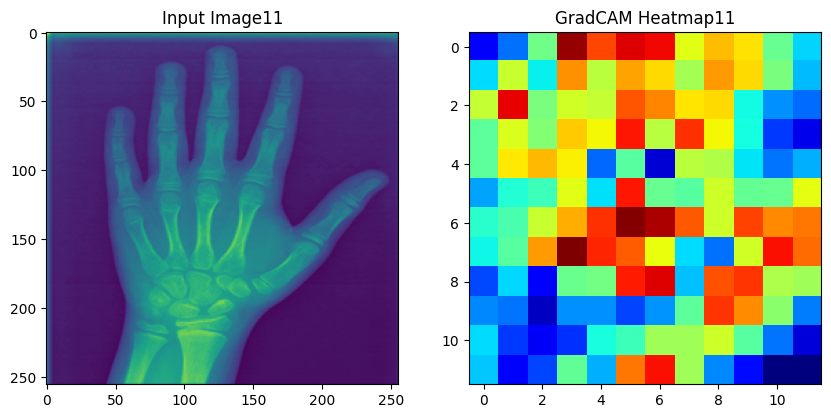

In [170]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input11.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image11')
ax[1].imshow(cam11, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap11')
plt.show()

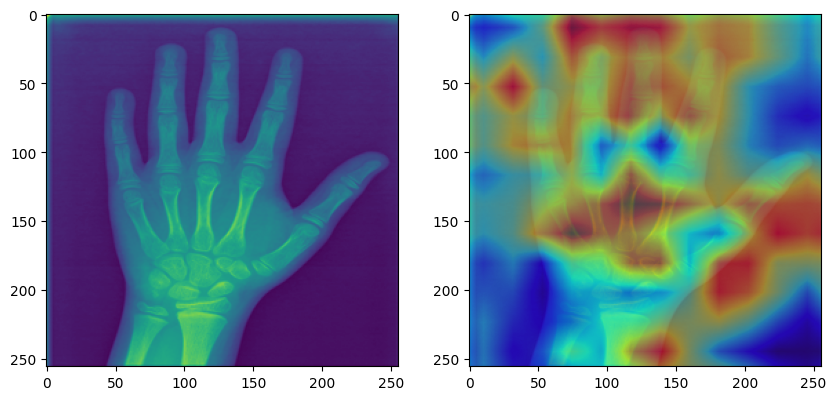

In [171]:
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].imshow(input11.squeeze().detach().numpy())
#ax[0].set_title("Video: " + sample_video + "Actual: " + y )

ax[1].imshow(input11.squeeze().detach().numpy())
ax[1].imshow(skimage.transform.resize(cam11, (input11.shape[2],input11.shape[3] )), alpha=0.5, cmap='jet')

#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

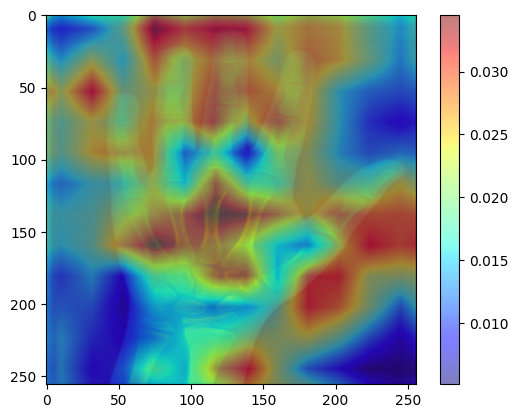

In [172]:
plt.imshow(input11.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam11, (input11.shape[2],input11.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap=6'jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image12

In [173]:
input12 = transform(Image.open(dataset_path('boneage_training_dataset/9856.png')).resize((256,256))).double()  # replace with your input
input12

tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]], dtype=torch.float64)

In [174]:
np.shape(input12)

torch.Size([1, 256, 256])

In [175]:
m12 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m12

tensor([1.], dtype=torch.float64)

In [176]:
input12 = input12.resize(1,1,256,256)
input12

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]]], dtype=torch.float64)

In [177]:
m12 = m12.resize(1,1)
m12

tensor([[1.]], dtype=torch.float64)

In [178]:
output12= model(input12, m12)
output12

tensor([[-0.2132]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [179]:
features = []
def get_features_hook(model, input12, output12):
    features.append(output12)

hook_handle12 = model.conv5.register_forward_hook(get_features_hook)
output12 = model(input12,m12)
hook_handle12.remove()

feature_maps12 = features[0]
gradients12 = model.conv5.weight.grad

In [180]:
weights12 = torch.mean(gradients12, axis=(2, 3))
cam12 = torch.zeros(feature_maps12.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights12[0]):
    cam12 += w * feature_maps12[0, i, :, :]
cam12 = torch.nn.functional.relu(cam12)
cam12 = cam12.detach().numpy()

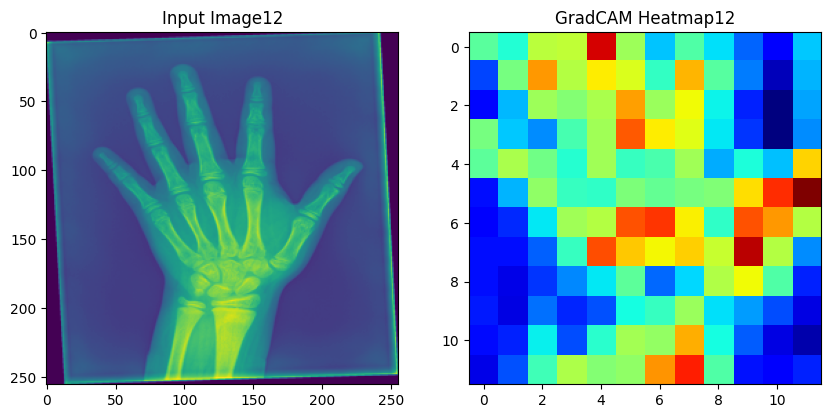

In [181]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input12.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image12')
ax[1].imshow(cam12, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap12')
plt.show()

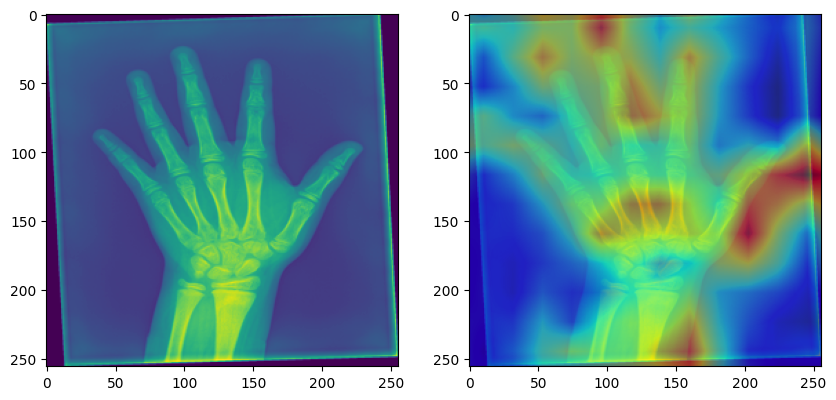

In [182]:
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].imshow(input12.squeeze().detach().numpy())
#ax[0].set_title("Video: " + sample_video + "Actual: " + y )

ax[1].imshow(input12.squeeze().detach().numpy())
ax[1].imshow(skimage.transform.resize(cam12, (input12.shape[2],input12.shape[3] )), alpha=0.5, cmap='jet')

#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

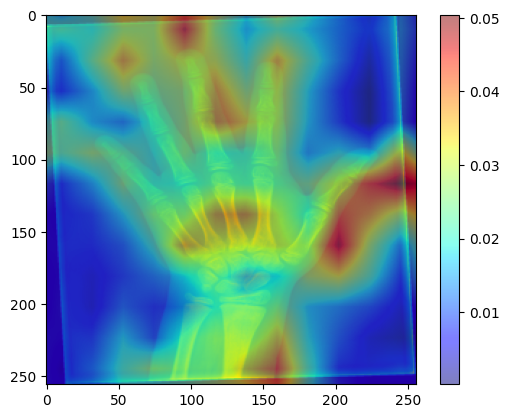

In [183]:
plt.imshow(input12.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam12, (input12.shape[2],input12.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap=6'jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image13

In [184]:
input13 = transform(Image.open(dataset_path('boneage_training_dataset/2473.png')).resize((256,256))).double()  # replace with your input
input13

tensor([[[0.0941, 0.0941, 0.0941,  ..., 0.0941, 0.0902, 0.0902],
         [0.0941, 0.0941, 0.0941,  ..., 0.0902, 0.0902, 0.0941],
         [0.0902, 0.0941, 0.0941,  ..., 0.0863, 0.0863, 0.0941],
         ...,
         [0.0941, 0.0902, 0.0902,  ..., 0.7333, 0.7451, 0.7529],
         [0.0902, 0.0902, 0.0902,  ..., 0.7373, 0.7451, 0.7686],
         [0.0902, 0.0902, 0.0902,  ..., 0.7216, 0.7451, 0.7647]]],
       dtype=torch.float64)

In [185]:
m13 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m13

tensor([1.], dtype=torch.float64)

In [186]:
input13 = input13.resize(1,1,256,256)
input13

tensor([[[[0.0941, 0.0941, 0.0941,  ..., 0.0941, 0.0902, 0.0902],
          [0.0941, 0.0941, 0.0941,  ..., 0.0902, 0.0902, 0.0941],
          [0.0902, 0.0941, 0.0941,  ..., 0.0863, 0.0863, 0.0941],
          ...,
          [0.0941, 0.0902, 0.0902,  ..., 0.7333, 0.7451, 0.7529],
          [0.0902, 0.0902, 0.0902,  ..., 0.7373, 0.7451, 0.7686],
          [0.0902, 0.0902, 0.0902,  ..., 0.7216, 0.7451, 0.7647]]]],
       dtype=torch.float64)

In [187]:
m13 = m13.resize(1,1)
m13

tensor([[1.]], dtype=torch.float64)

In [188]:
output13= model(input13, m13)
output13

tensor([[1.7913]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [189]:
features = []
def get_features_hook(model, input13, output13):
    features.append(output13)

hook_handle13 = model.conv5.register_forward_hook(get_features_hook)
output13 = model(input13,m13)
hook_handle13.remove()

feature_maps13 = features[0]
gradients13 = model.conv5.weight.grad

In [190]:
weights13 = torch.mean(gradients13, axis=(2, 3))
cam13 = torch.zeros(feature_maps13.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights13[0]):
    cam13 += w * feature_maps13[0, i, :, :]
cam13 = torch.nn.functional.relu(cam13)
cam13 = cam13.detach().numpy()

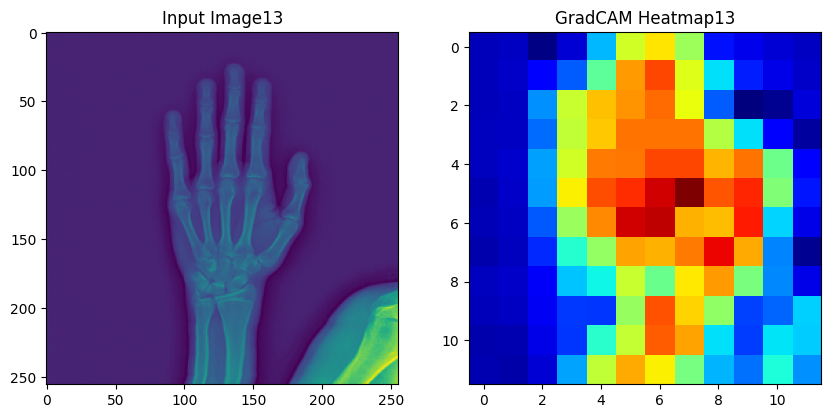

In [191]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input13.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image13')
ax[1].imshow(cam13, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap13')
plt.show()

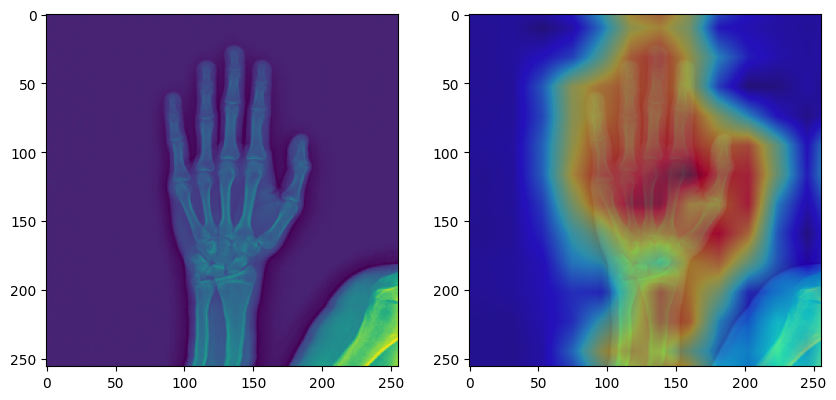

In [192]:
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].imshow(input13.squeeze().detach().numpy())
#ax[0].set_title("Video: " + sample_video + "Actual: " + y )

ax[1].imshow(input13.squeeze().detach().numpy())
ax[1].imshow(skimage.transform.resize(cam13, (input13.shape[2],input13.shape[3] )), alpha=0.5, cmap='jet')

#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

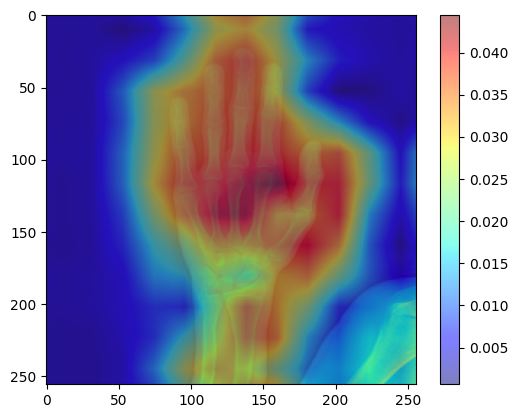

In [193]:
plt.imshow(input13.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam13, (input13.shape[2],input13.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap=6'jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image14

In [194]:
input14 = transform(Image.open(dataset_path('boneage_training_dataset/2479.png')).resize((256,256))).double()  # replace with your input
input14

tensor([[[0.2118, 0.2118, 0.2157,  ..., 0.2039, 0.2078, 0.2157],
         [0.2157, 0.2118, 0.2118,  ..., 0.2118, 0.2078, 0.2157],
         [0.2196, 0.2078, 0.2078,  ..., 0.2078, 0.2118, 0.2078],
         ...,
         [0.2118, 0.2078, 0.2078,  ..., 0.2157, 0.2078, 0.2157],
         [0.2078, 0.2078, 0.2078,  ..., 0.2118, 0.2078, 0.2078],
         [0.2118, 0.2039, 0.2157,  ..., 0.2118, 0.2078, 0.2118]]],
       dtype=torch.float64)

In [195]:
m14 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m14

tensor([1.], dtype=torch.float64)

In [196]:
input14 = input14.resize(1,1,256,256)
input14

tensor([[[[0.2118, 0.2118, 0.2157,  ..., 0.2039, 0.2078, 0.2157],
          [0.2157, 0.2118, 0.2118,  ..., 0.2118, 0.2078, 0.2157],
          [0.2196, 0.2078, 0.2078,  ..., 0.2078, 0.2118, 0.2078],
          ...,
          [0.2118, 0.2078, 0.2078,  ..., 0.2157, 0.2078, 0.2157],
          [0.2078, 0.2078, 0.2078,  ..., 0.2118, 0.2078, 0.2078],
          [0.2118, 0.2039, 0.2157,  ..., 0.2118, 0.2078, 0.2118]]]],
       dtype=torch.float64)

In [197]:
m14 = m14.resize(1,1)
m14

tensor([[1.]], dtype=torch.float64)

In [198]:
output14= model(input14, m14)
output14

tensor([[1.3974]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [199]:
features = []
def get_features_hook(model, input14, output14):
    features.append(output14)

hook_handle14 = model.conv5.register_forward_hook(get_features_hook)
output14 = model(input14,m14)
hook_handle14.remove()

feature_maps14 = features[0]
gradients14 = model.conv5.weight.grad

In [200]:
weights14 = torch.mean(gradients14, axis=(2, 3))
cam14 = torch.zeros(feature_maps14.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights14[0]):
    cam14 += w * feature_maps14[0, i, :, :]
cam14 = torch.nn.functional.relu(cam14)
cam14 = cam14.detach().numpy()

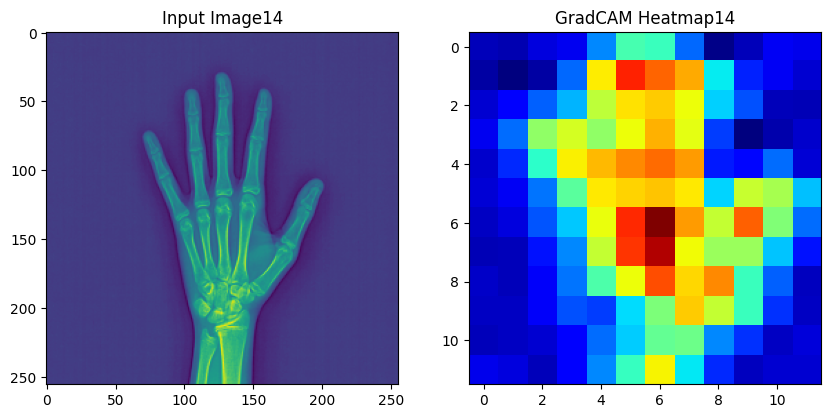

In [201]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input14.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image14')
ax[1].imshow(cam14, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap14')
plt.show()

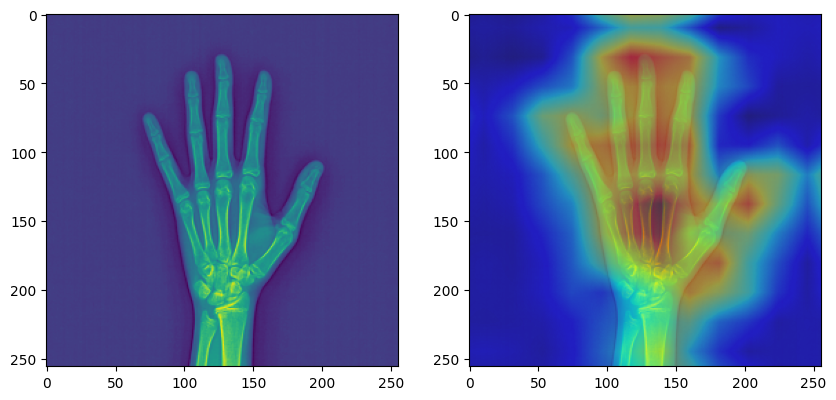

In [202]:
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].imshow(input14.squeeze().detach().numpy())
#ax[0].set_title("Video: " + sample_video + "Actual: " + y )

ax[1].imshow(input14.squeeze().detach().numpy())
ax[1].imshow(skimage.transform.resize(cam14, (input14.shape[2],input14.shape[3] )), alpha=0.5, cmap='jet')

#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

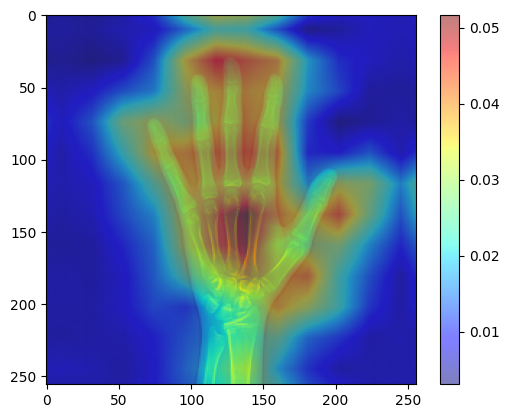

In [203]:
plt.imshow(input14.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam14, (input14.shape[2],input14.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap=6'jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image15

In [204]:
input15 = transform(Image.open(dataset_path('boneage_training_dataset/2505.png')).resize((256,256))).double()  # replace with your input
input15

tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]], dtype=torch.float64)

In [205]:
m15 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m15

tensor([1.], dtype=torch.float64)

In [206]:
input15 = input15.resize(1,1,256,256)
input15

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]]], dtype=torch.float64)

In [207]:
m15 = m15.resize(1,1)
m15

tensor([[1.]], dtype=torch.float64)

In [208]:
output15= model(input15, m15)
output15

tensor([[-2.7781]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [209]:
features = []
def get_features_hook(model, input15, output15):
    features.append(output15)

hook_handle15 = model.conv5.register_forward_hook(get_features_hook)
output15 = model(input15,m15)
hook_handle15.remove()

feature_maps15 = features[0]
gradients15 = model.conv5.weight.grad

In [210]:
weights15 = torch.mean(gradients15, axis=(2, 3))
cam15 = torch.zeros(feature_maps15.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights15[0]):
    cam15 += w * feature_maps15[0, i, :, :]
cam15 = torch.nn.functional.relu(cam15)
cam15 = cam15.detach().numpy()

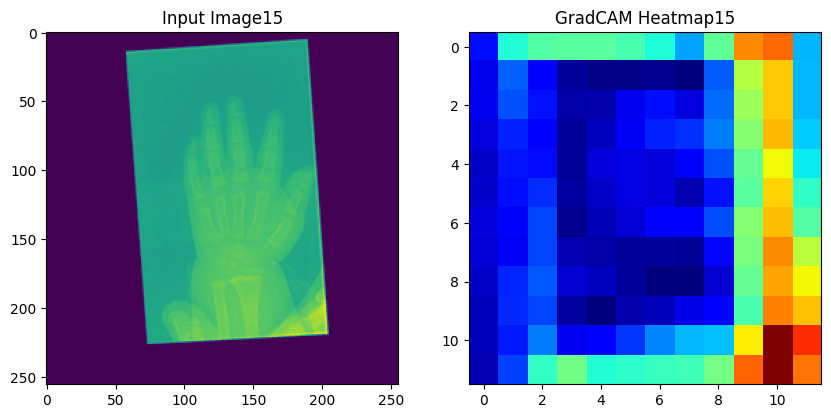

In [211]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input15.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image15')
ax[1].imshow(cam15, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap15')
plt.show()

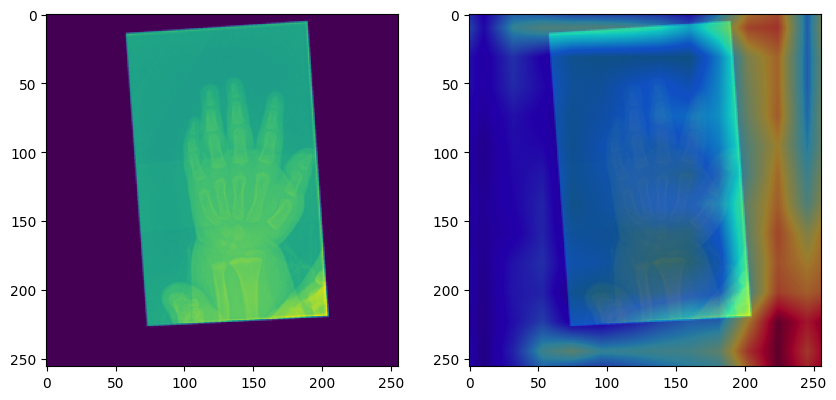

In [212]:
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].imshow(input15.squeeze().detach().numpy())
#ax[0].set_title("Video: " + sample_video + "Actual: " + y )

ax[1].imshow(input15.squeeze().detach().numpy())
ax[1].imshow(skimage.transform.resize(cam15, (input15.shape[2],input15.shape[3] )), alpha=0.5, cmap='jet')

#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

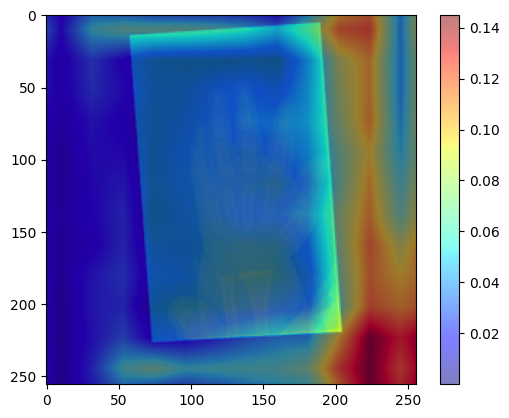

In [213]:
plt.imshow(input15.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam15, (input15.shape[2],input15.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap=6'jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image16

In [214]:
input16 = transform(Image.open(dataset_path('boneage_training_dataset/2504.png')).resize((256,256))).double()  # replace with your input
input16

tensor([[[0.2000, 0.2706, 0.3059,  ..., 0.4314, 0.4196, 0.4314],
         [0.2275, 0.3137, 0.3216,  ..., 0.3176, 0.3059, 0.3294],
         [0.2235, 0.3059, 0.3059,  ..., 0.1804, 0.1804, 0.1804],
         ...,
         [0.1843, 0.2314, 0.2275,  ..., 0.2510, 0.2902, 0.3098],
         [0.1961, 0.2471, 0.2431,  ..., 0.2471, 0.2902, 0.3098],
         [0.2314, 0.2980, 0.2941,  ..., 0.2627, 0.2941, 0.3137]]],
       dtype=torch.float64)

In [215]:
m16 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m16

tensor([1.], dtype=torch.float64)

In [216]:
input16 = input16.resize(1,1,256,256)
input16

tensor([[[[0.2000, 0.2706, 0.3059,  ..., 0.4314, 0.4196, 0.4314],
          [0.2275, 0.3137, 0.3216,  ..., 0.3176, 0.3059, 0.3294],
          [0.2235, 0.3059, 0.3059,  ..., 0.1804, 0.1804, 0.1804],
          ...,
          [0.1843, 0.2314, 0.2275,  ..., 0.2510, 0.2902, 0.3098],
          [0.1961, 0.2471, 0.2431,  ..., 0.2471, 0.2902, 0.3098],
          [0.2314, 0.2980, 0.2941,  ..., 0.2627, 0.2941, 0.3137]]]],
       dtype=torch.float64)

In [217]:
m16 = m16.resize(1,1)
m16

tensor([[1.]], dtype=torch.float64)

In [218]:
output16= model(input16, m16)
output16

tensor([[1.3338]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [219]:
features = []
def get_features_hook(model, input16, output16):
    features.append(output16)

hook_handle16 = model.conv5.register_forward_hook(get_features_hook)
output16 = model(input16,m16)
hook_handle16.remove()

feature_maps16 = features[0]
gradients16 = model.conv5.weight.grad

In [220]:
weights16 = torch.mean(gradients16, axis=(2, 3))
cam16 = torch.zeros(feature_maps16.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights16[0]):
    cam16 += w * feature_maps16[0, i, :, :]
cam16 = torch.nn.functional.relu(cam16)
cam16 = cam16.detach().numpy()

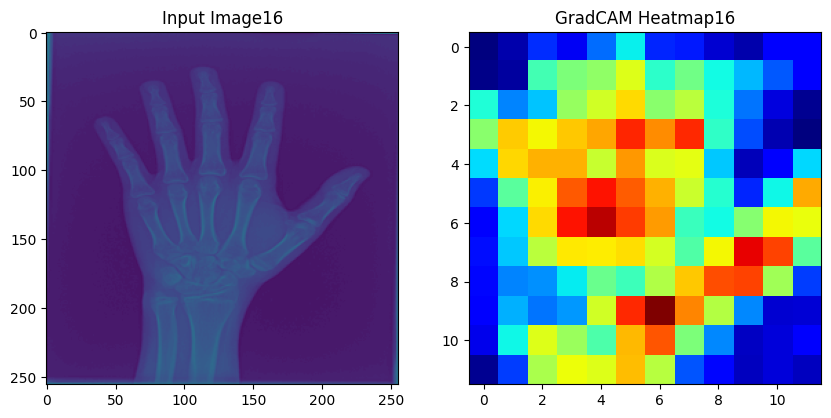

In [221]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input16.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image16')
ax[1].imshow(cam16, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap16')
plt.show()

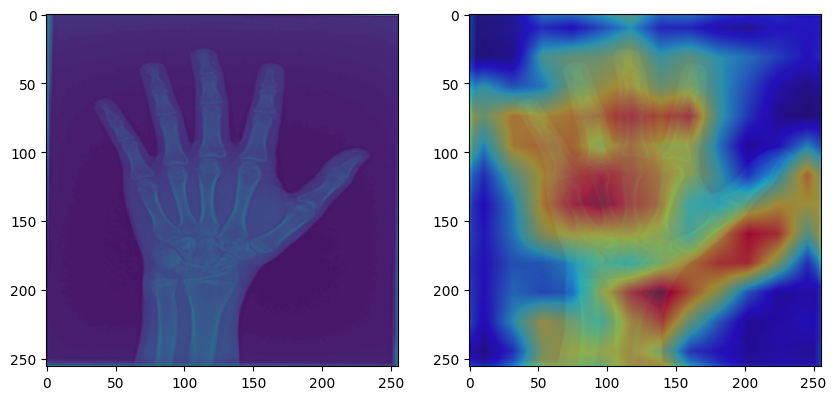

In [222]:
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].imshow(input16.squeeze().detach().numpy())
#ax[0].set_title("Video: " + sample_video + "Actual: " + y )

ax[1].imshow(input16.squeeze().detach().numpy())
ax[1].imshow(skimage.transform.resize(cam16, (input16.shape[2],input16.shape[3] )), alpha=0.5, cmap='jet')

#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

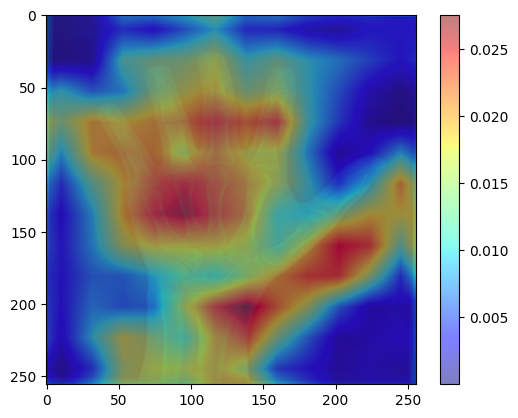

In [223]:
plt.imshow(input16.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam16, (input16.shape[2],input16.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap=6'jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image17

In [224]:
input17 = transform(Image.open(dataset_path('boneage_training_dataset/3880.png')).resize((256,256))).double()  # replace with your input
input17

tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]], dtype=torch.float64)

In [225]:
m17 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m17

tensor([1.], dtype=torch.float64)

In [226]:
input17 = input17.resize(1,1,256,256)
input17

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]]], dtype=torch.float64)

In [227]:
m17 = m17.resize(1,1)
m17

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[1.]], dtype=torch.float64)

In [228]:
output17= model(input17, m17)
output17

tensor([[-2.8875]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [229]:
features = []
def get_features_hook(model, input17, output17):
    features.append(output17)

hook_handle17 = model.conv5.register_forward_hook(get_features_hook)
output17 = model(input17,m17)
hook_handle17.remove()

feature_maps17 = features[0]
gradients17 = model.conv5.weight.grad

In [230]:
weights17 = torch.mean(gradients17, axis=(2, 3))
cam17 = torch.zeros(feature_maps17.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights17[0]):
    cam17 += w * feature_maps17[0, i, :, :]
cam17 = torch.nn.functional.relu(cam17)
cam17 = cam17.detach().numpy()

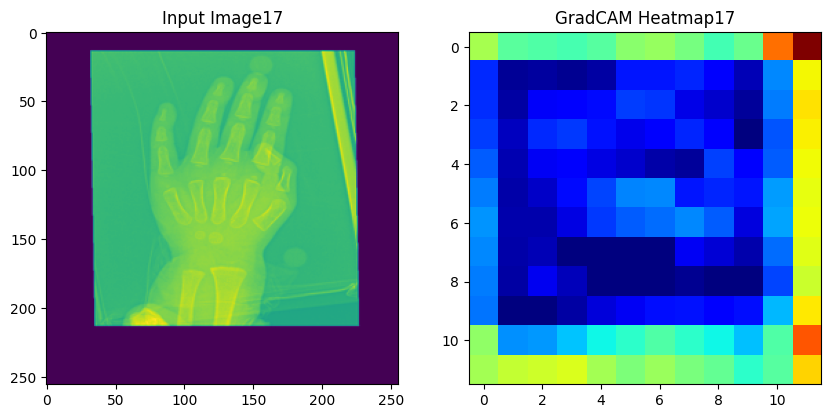

In [231]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input17.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image17')
ax[1].imshow(cam17, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap17')
plt.show()

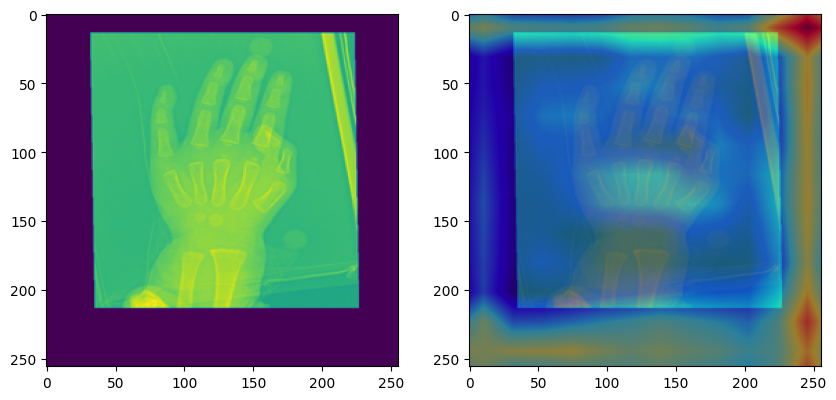

In [232]:
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].imshow(input17.squeeze().detach().numpy())
#ax[0].set_title("Video: " + sample_video + "Actual: " + y )

ax[1].imshow(input17.squeeze().detach().numpy())
ax[1].imshow(skimage.transform.resize(cam17, (input17.shape[2],input17.shape[3] )), alpha=0.5, cmap='jet')

#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

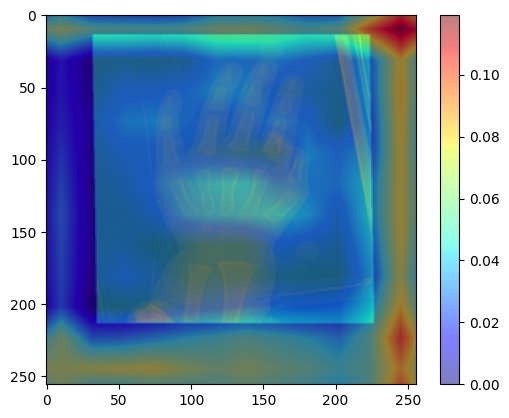

In [233]:
plt.imshow(input17.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam17, (input17.shape[2],input17.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap=6'jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image18

In [234]:
input18 = transform(Image.open(dataset_path('boneage_training_dataset/3933.png')).resize((256,256))).double()  # replace with your input
input18

tensor([[[0.3059, 0.3059, 0.2510,  ..., 0.2667, 0.2627, 0.2627],
         [0.3294, 0.2745, 0.2078,  ..., 0.2314, 0.2431, 0.2627],
         [0.3569, 0.2510, 0.1882,  ..., 0.2000, 0.2157, 0.2431],
         ...,
         [0.1647, 0.2039, 0.2000,  ..., 0.2314, 0.2471, 0.4235],
         [0.1843, 0.2431, 0.2353,  ..., 0.2431, 0.2549, 0.4157],
         [0.2392, 0.3059, 0.2980,  ..., 0.2235, 0.2235, 0.3647]]],
       dtype=torch.float64)

In [235]:
m18 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m18

tensor([1.], dtype=torch.float64)

In [236]:
input18 = input18.resize(1,1,256,256)
input18

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[[[0.3059, 0.3059, 0.2510,  ..., 0.2667, 0.2627, 0.2627],
          [0.3294, 0.2745, 0.2078,  ..., 0.2314, 0.2431, 0.2627],
          [0.3569, 0.2510, 0.1882,  ..., 0.2000, 0.2157, 0.2431],
          ...,
          [0.1647, 0.2039, 0.2000,  ..., 0.2314, 0.2471, 0.4235],
          [0.1843, 0.2431, 0.2353,  ..., 0.2431, 0.2549, 0.4157],
          [0.2392, 0.3059, 0.2980,  ..., 0.2235, 0.2235, 0.3647]]]],
       dtype=torch.float64)

In [237]:
m18 = m18.resize(1,1)
m18

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[1.]], dtype=torch.float64)

In [238]:
output18= model(input18, m18)
output18

tensor([[1.1218]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [239]:
features = []
def get_features_hook(model, input18, output18):
    features.append(output18)

hook_handle18 = model.conv5.register_forward_hook(get_features_hook)
output18 = model(input18,m18)
hook_handle18.remove()

feature_maps18 = features[0]
gradients18 = model.conv5.weight.grad

In [240]:
weights18 = torch.mean(gradients18, axis=(2, 3))
cam18 = torch.zeros(feature_maps18.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights18[0]):
    cam18 += w * feature_maps18[0, i, :, :]
cam18 = torch.nn.functional.relu(cam18)
cam18 = cam18.detach().numpy()

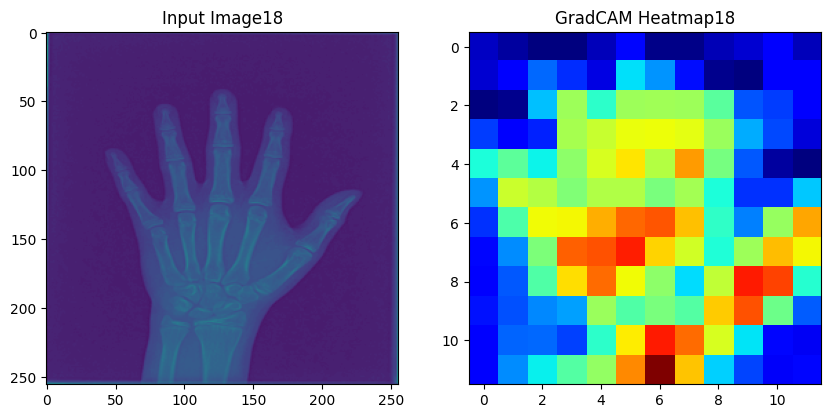

In [241]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input18.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image18')
ax[1].imshow(cam18, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap18')
plt.show()

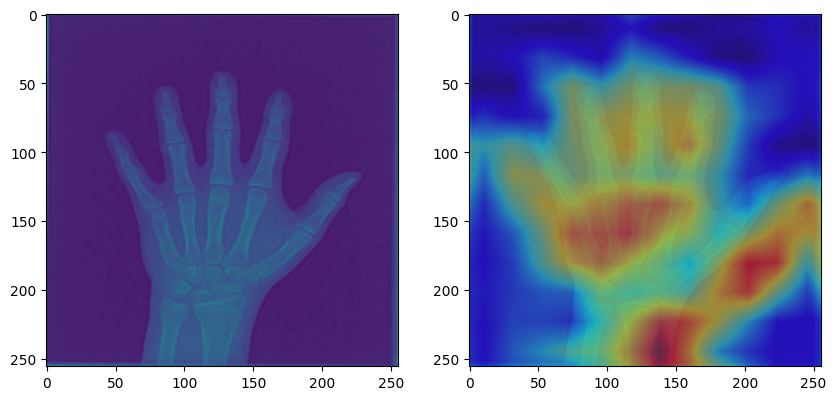

In [242]:
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].imshow(input18.squeeze().detach().numpy())
#ax[0].set_title("Video: " + sample_video + "Actual: " + y )

ax[1].imshow(input18.squeeze().detach().numpy())
ax[1].imshow(skimage.transform.resize(cam18, (input18.shape[2],input18.shape[3] )), alpha=0.5, cmap='jet')

#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

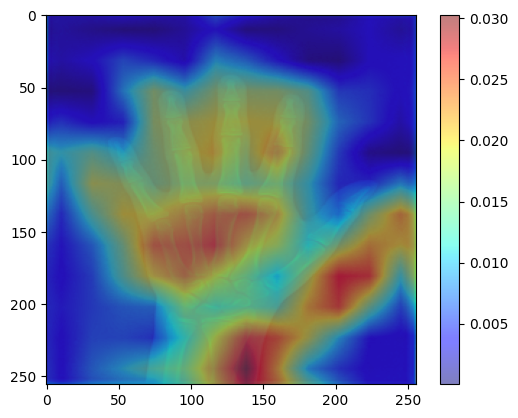

In [243]:
plt.imshow(input18.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam18, (input18.shape[2],input18.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap=6'jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image19

In [244]:
input19 = transform(Image.open(dataset_path('boneage_training_dataset/3986.png')).resize((256,256))).double()  # replace with your input
input19

tensor([[[0.2196, 0.2706, 0.2667,  ..., 0.2941, 0.2667, 0.2706],
         [0.2902, 0.3686, 0.3686,  ..., 0.3373, 0.3137, 0.3098],
         [0.3216, 0.3647, 0.3608,  ..., 0.3373, 0.3137, 0.3020],
         ...,
         [0.2392, 0.3098, 0.3451,  ..., 0.2196, 0.2196, 0.2235],
         [0.2431, 0.3098, 0.3333,  ..., 0.2353, 0.2431, 0.2471],
         [0.2431, 0.3059, 0.3176,  ..., 0.2627, 0.2706, 0.2706]]],
       dtype=torch.float64)

In [245]:
m19 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m19

tensor([1.], dtype=torch.float64)

In [246]:
input19 = input19.resize(1,1,256,256)
input19

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[[[0.2196, 0.2706, 0.2667,  ..., 0.2941, 0.2667, 0.2706],
          [0.2902, 0.3686, 0.3686,  ..., 0.3373, 0.3137, 0.3098],
          [0.3216, 0.3647, 0.3608,  ..., 0.3373, 0.3137, 0.3020],
          ...,
          [0.2392, 0.3098, 0.3451,  ..., 0.2196, 0.2196, 0.2235],
          [0.2431, 0.3098, 0.3333,  ..., 0.2353, 0.2431, 0.2471],
          [0.2431, 0.3059, 0.3176,  ..., 0.2627, 0.2706, 0.2706]]]],
       dtype=torch.float64)

In [247]:
m19 = m19.resize(1,1)
m19

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[1.]], dtype=torch.float64)

In [248]:
output19= model(input19, m19)
output19

tensor([[1.7042]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [249]:
features = []
def get_features_hook(model, input19, output19):
    features.append(output19)

hook_handle19 = model.conv5.register_forward_hook(get_features_hook)
output19 = model(input19,m19)
hook_handle19.remove()

feature_maps19 = features[0]
gradients19 = model.conv5.weight.grad

In [250]:
weights19 = torch.mean(gradients19, axis=(2, 3))
cam19 = torch.zeros(feature_maps19.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights19[0]):
    cam19 += w * feature_maps19[0, i, :, :]
cam19 = torch.nn.functional.relu(cam19)
cam19 = cam19.detach().numpy()

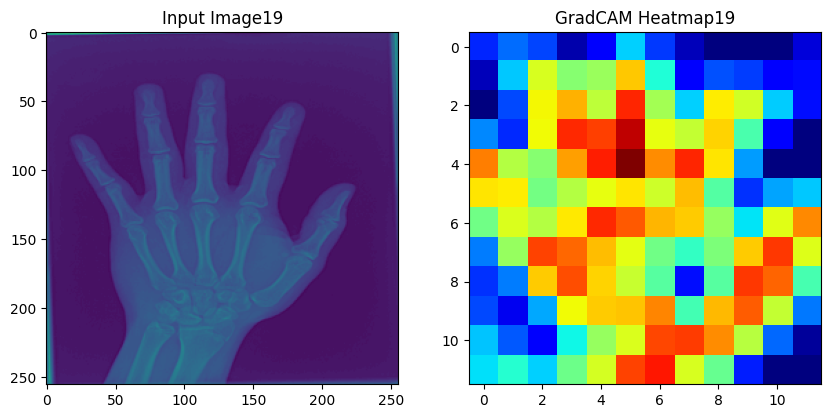

In [251]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input19.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image19')
ax[1].imshow(cam19, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap19')
plt.show()

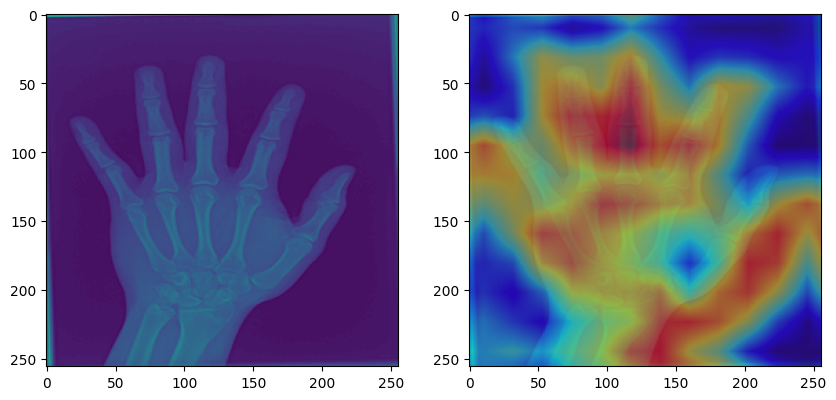

In [252]:
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].imshow(input19.squeeze().detach().numpy())
#ax[0].set_title("Video: " + sample_video + "Actual: " + y )

ax[1].imshow(input19.squeeze().detach().numpy())
ax[1].imshow(skimage.transform.resize(cam19, (input19.shape[2],input19.shape[3] )), alpha=0.5, cmap='jet')

#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

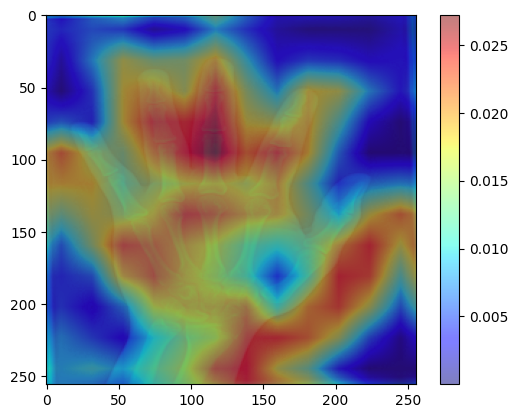

In [253]:
plt.imshow(input19.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam19, (input19.shape[2],input19.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap=6'jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image20

In [254]:
input20 = transform(Image.open(dataset_path('boneage_training_dataset/3303.png')).resize((256,256))).double()  # replace with your input
input20

tensor([[[0.1843, 0.1804, 0.1804,  ..., 0.1647, 0.1647, 0.1647],
         [0.1882, 0.1843, 0.1843,  ..., 0.1686, 0.1647, 0.1647],
         [0.1843, 0.1843, 0.1804,  ..., 0.1686, 0.1647, 0.1647],
         ...,
         [0.1765, 0.1725, 0.1725,  ..., 0.1608, 0.1608, 0.1608],
         [0.1725, 0.1725, 0.1725,  ..., 0.1569, 0.1608, 0.1608],
         [0.1725, 0.1725, 0.1725,  ..., 0.1608, 0.1608, 0.1608]]],
       dtype=torch.float64)

In [255]:
m20 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m20

tensor([1.], dtype=torch.float64)

In [256]:
input20 = input20.resize(1,1,256,256)
input20

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[[[0.1843, 0.1804, 0.1804,  ..., 0.1647, 0.1647, 0.1647],
          [0.1882, 0.1843, 0.1843,  ..., 0.1686, 0.1647, 0.1647],
          [0.1843, 0.1843, 0.1804,  ..., 0.1686, 0.1647, 0.1647],
          ...,
          [0.1765, 0.1725, 0.1725,  ..., 0.1608, 0.1608, 0.1608],
          [0.1725, 0.1725, 0.1725,  ..., 0.1569, 0.1608, 0.1608],
          [0.1725, 0.1725, 0.1725,  ..., 0.1608, 0.1608, 0.1608]]]],
       dtype=torch.float64)

In [257]:
m20 = m20.resize(1,1)
m20

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[1.]], dtype=torch.float64)

In [258]:
output20= model(input20, m20)
output20

tensor([[1.1452]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [259]:
features = []
def get_features_hook(model, input20, output20):
    features.append(output20)

hook_handle20 = model.conv5.register_forward_hook(get_features_hook)
output20 = model(input20,m20)
hook_handle20.remove()

feature_maps20 = features[0]
gradients20 = model.conv5.weight.grad

In [260]:
weights20 = torch.mean(gradients20, axis=(2, 3))
cam20 = torch.zeros(feature_maps20.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights20[0]):
    cam20 += w * feature_maps20[0, i, :, :]
cam20 = torch.nn.functional.relu(cam20)
cam20 = cam20.detach().numpy()

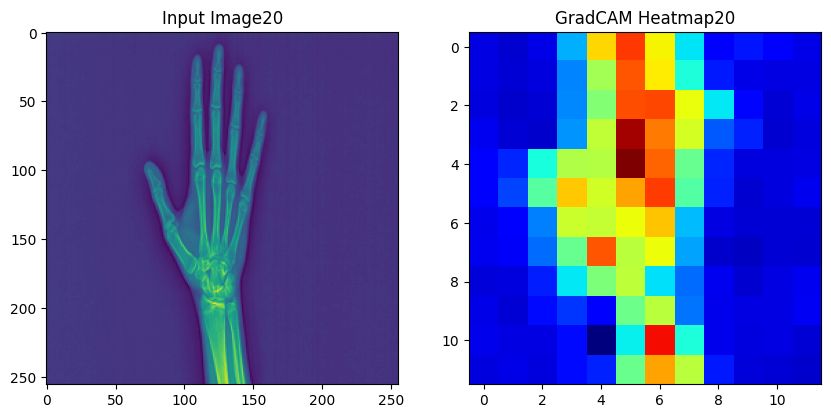

In [261]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input20.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image20')
ax[1].imshow(cam20, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap20')
plt.show()

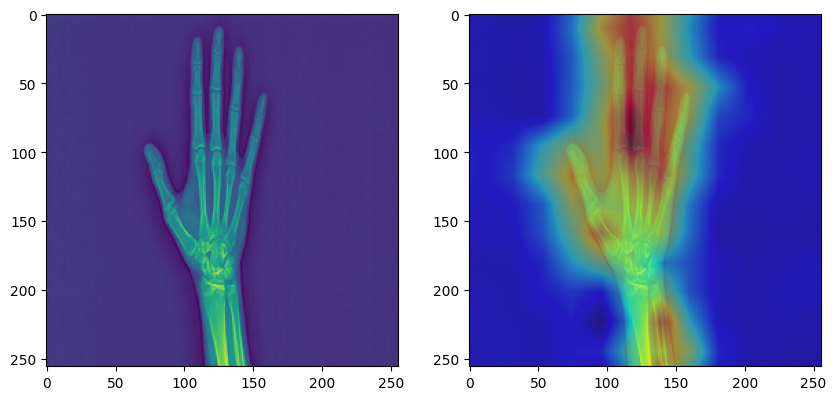

In [262]:
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].imshow(input20.squeeze().detach().numpy())
#ax[0].set_title("Video: " + sample_video + "Actual: " + y )

ax[1].imshow(input20.squeeze().detach().numpy())
ax[1].imshow(skimage.transform.resize(cam20, (input20.shape[2],input20.shape[3] )), alpha=0.5, cmap='jet')

#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

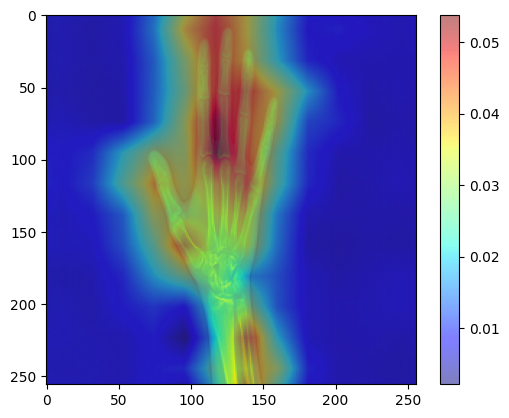

In [263]:
plt.imshow(input20.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam20, (input20.shape[2],input20.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap=6'jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image21

In [264]:
input21 = transform(Image.open(dataset_path('boneage_training_dataset/3473.png')).resize((256,256))).double()  # replace with your input
input21

tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]], dtype=torch.float64)

In [265]:
m21 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m21

tensor([1.], dtype=torch.float64)

In [266]:
input21 = input21.resize(1,1,256,256)
input21

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]]], dtype=torch.float64)

In [267]:
m21 = m21.resize(1,1)
m21

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[1.]], dtype=torch.float64)

In [268]:
output21= model(input21, m21)
output21

tensor([[2.0515]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [269]:
features = []
def get_features_hook(model, input21, output21):
    features.append(output21)

hook_handle21 = model.conv5.register_forward_hook(get_features_hook)
output21 = model(input21,m21)
hook_handle21.remove()

feature_maps21 = features[0]
gradients21 = model.conv5.weight.grad

In [270]:
weights21 = torch.mean(gradients21, axis=(2, 3))
cam21 = torch.zeros(feature_maps21.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights21[0]):
    cam21 += w * feature_maps21[0, i, :, :]
cam21 = torch.nn.functional.relu(cam21)
cam21 = cam21.detach().numpy()

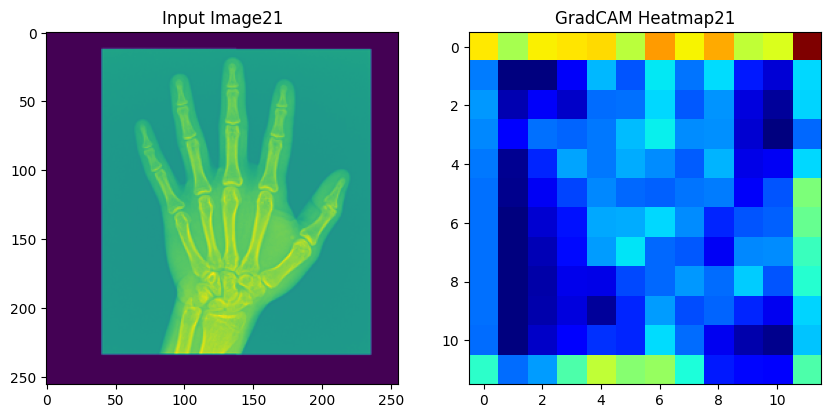

In [271]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input21.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image21')
ax[1].imshow(cam21, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap21')
plt.show()

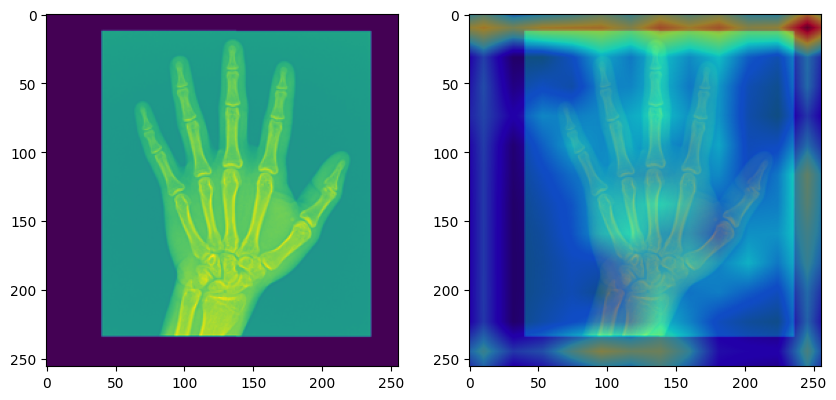

In [272]:
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].imshow(input21.squeeze().detach().numpy())
#ax[0].set_title("Video: " + sample_video + "Actual: " + y )

ax[1].imshow(input21.squeeze().detach().numpy())
ax[1].imshow(skimage.transform.resize(cam21, (input21.shape[2],input21.shape[3] )), alpha=0.5, cmap='jet')

#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

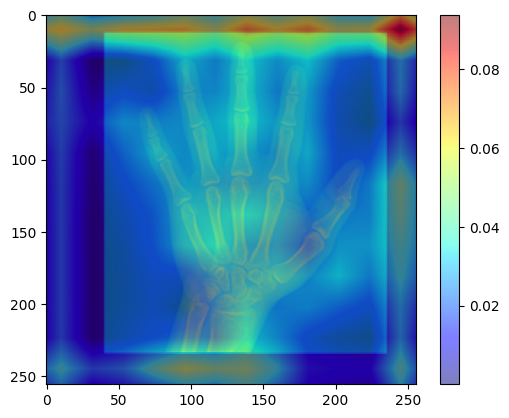

In [273]:
plt.imshow(input21.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam21, (input21.shape[2],input21.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap=6'jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image22

In [274]:
input22 = transform(Image.open(dataset_path('boneage_training_dataset/1459.png')).resize((256,256))).double()  # replace with your input
input22

tensor([[[0.0667, 0.0667, 0.0667,  ..., 0.0784, 0.0824, 0.0784],
         [0.0667, 0.0667, 0.0667,  ..., 0.0784, 0.0784, 0.0784],
         [0.0706, 0.0667, 0.0667,  ..., 0.0784, 0.0784, 0.0784],
         ...,
         [0.0667, 0.0667, 0.0627,  ..., 0.0588, 0.0627, 0.0627],
         [0.0667, 0.0667, 0.0627,  ..., 0.0588, 0.0588, 0.0627],
         [0.0667, 0.0667, 0.0667,  ..., 0.0627, 0.0627, 0.0588]]],
       dtype=torch.float64)

In [275]:
m22 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m22

tensor([1.], dtype=torch.float64)

In [276]:
input22 = input22.resize(1,1,256,256)
input22

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[[[0.0667, 0.0667, 0.0667,  ..., 0.0784, 0.0824, 0.0784],
          [0.0667, 0.0667, 0.0667,  ..., 0.0784, 0.0784, 0.0784],
          [0.0706, 0.0667, 0.0667,  ..., 0.0784, 0.0784, 0.0784],
          ...,
          [0.0667, 0.0667, 0.0627,  ..., 0.0588, 0.0627, 0.0627],
          [0.0667, 0.0667, 0.0627,  ..., 0.0588, 0.0588, 0.0627],
          [0.0667, 0.0667, 0.0667,  ..., 0.0627, 0.0627, 0.0588]]]],
       dtype=torch.float64)

In [277]:
m22 = m22.resize(1,1)
m22

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[1.]], dtype=torch.float64)

In [278]:
output22= model(input22, m22)
output22

tensor([[-0.0623]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [279]:
features = []
def get_features_hook(model, input22, output22):
    features.append(output22)

hook_handle22 = model.conv5.register_forward_hook(get_features_hook)
output22 = model(input22,m22)
hook_handle22.remove()

feature_maps22 = features[0]
gradients22 = model.conv5.weight.grad

In [280]:
weights22 = torch.mean(gradients22, axis=(2, 3))
cam22 = torch.zeros(feature_maps22.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights22[0]):
    cam22 += w * feature_maps22[0, i, :, :]
cam22 = torch.nn.functional.relu(cam22)
cam22 = cam22.detach().numpy()

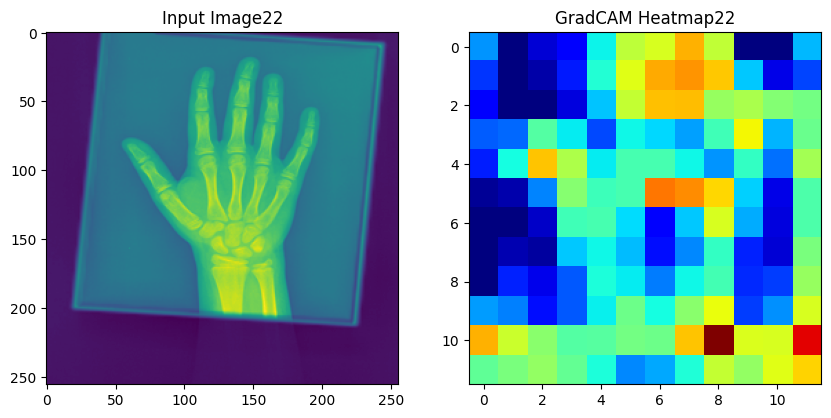

In [281]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input22.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image22')
ax[1].imshow(cam22, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap22')
plt.show()

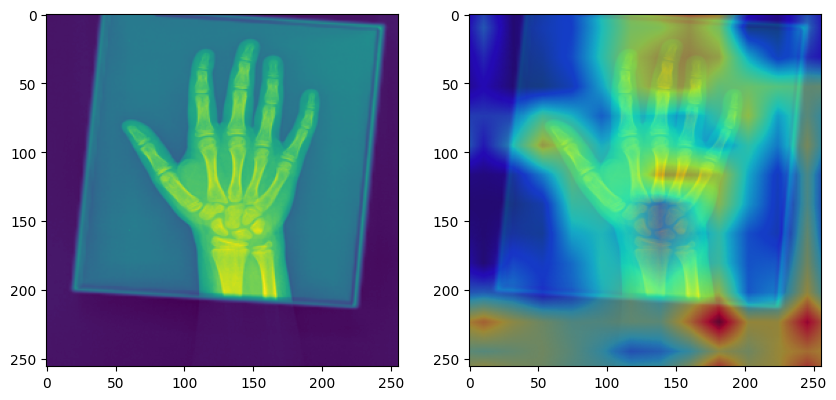

In [282]:
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].imshow(input22.squeeze().detach().numpy())
#ax[0].set_title("Video: " + sample_video + "Actual: " + y )

ax[1].imshow(input22.squeeze().detach().numpy())
ax[1].imshow(skimage.transform.resize(cam22, (input22.shape[2],input22.shape[3] )), alpha=0.5, cmap='jet')

#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap='jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

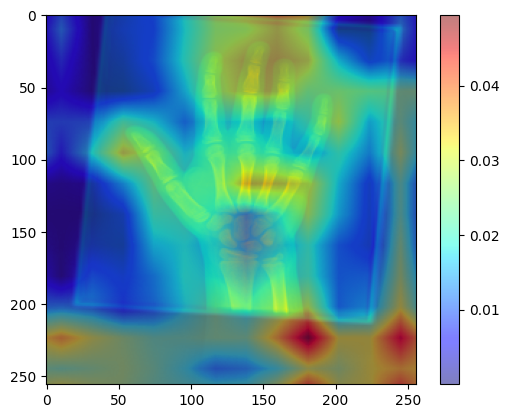

In [283]:
plt.imshow(input22.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam22, (input22.shape[2],input22.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap=6'jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image23

In [284]:
input23 = transform(Image.open(dataset_path('boneage_training_dataset/4229.png')).resize((256,256))).double()  # replace with your input
input23

tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0667,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]]],
       dtype=torch.float64)

In [285]:
m23 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m23

tensor([1.], dtype=torch.float64)

In [286]:
input23 = input23.resize(1,1,256,256)
input23

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0667,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]]]],
       dtype=torch.float64)

In [287]:
m23 = m23.resize(1,1)
m23

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[1.]], dtype=torch.float64)

In [288]:
output23= model(input23, m23)
output23

tensor([[0.0777]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [289]:
features = []
def get_features_hook(model, input23, output23):
    features.append(output23)

hook_handle23 = model.conv5.register_forward_hook(get_features_hook)
output23 = model(input23,m23)
hook_handle23.remove()

feature_maps23 = features[0]
gradients23 = model.conv5.weight.grad

In [290]:
weights23 = torch.mean(gradients23, axis=(2, 3))
cam23 = torch.zeros(feature_maps23.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights23[0]):
    cam23 += w * feature_maps23[0, i, :, :]
cam23 = torch.nn.functional.relu(cam23)
cam23 = cam23.detach().numpy()

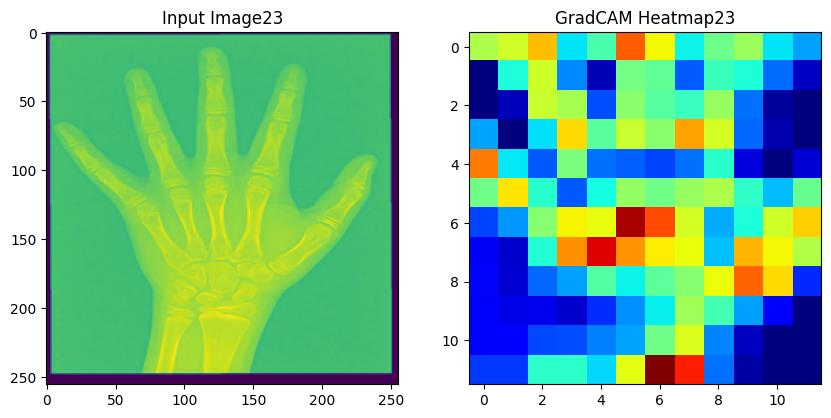

In [291]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input23.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image23')
ax[1].imshow(cam23, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap23')
plt.show()

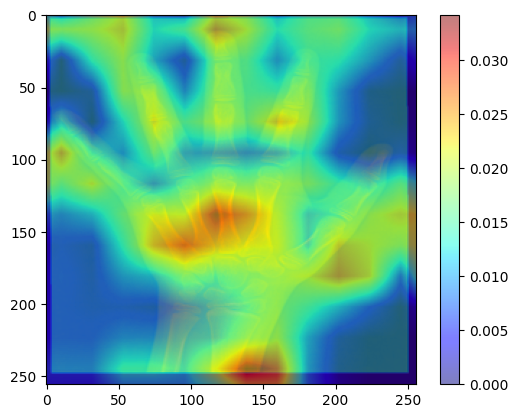

In [292]:
plt.imshow(input23.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam23, (input23.shape[2],input23.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap=6'jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image24

In [293]:
input24 = transform(Image.open(dataset_path('boneage_training_dataset/1936.png')).resize((256,256))).double()  # replace with your input
input24

tensor([[[0.1922, 0.1922, 0.1922,  ..., 0.1843, 0.1882, 0.1882],
         [0.1882, 0.1882, 0.1922,  ..., 0.1843, 0.1843, 0.1882],
         [0.1882, 0.1882, 0.1922,  ..., 0.1843, 0.1843, 0.1882],
         ...,
         [0.1922, 0.1922, 0.1882,  ..., 0.1843, 0.1843, 0.1843],
         [0.1922, 0.1922, 0.1882,  ..., 0.1843, 0.1843, 0.1843],
         [0.1882, 0.1922, 0.1882,  ..., 0.1843, 0.1843, 0.1882]]],
       dtype=torch.float64)

In [294]:
m24 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m24

tensor([1.], dtype=torch.float64)

In [295]:
input24 = input24.resize(1,1,256,256)
input24

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[[[0.1922, 0.1922, 0.1922,  ..., 0.1843, 0.1882, 0.1882],
          [0.1882, 0.1882, 0.1922,  ..., 0.1843, 0.1843, 0.1882],
          [0.1882, 0.1882, 0.1922,  ..., 0.1843, 0.1843, 0.1882],
          ...,
          [0.1922, 0.1922, 0.1882,  ..., 0.1843, 0.1843, 0.1843],
          [0.1922, 0.1922, 0.1882,  ..., 0.1843, 0.1843, 0.1843],
          [0.1882, 0.1922, 0.1882,  ..., 0.1843, 0.1843, 0.1882]]]],
       dtype=torch.float64)

In [296]:
m24 = m24.resize(1,1)
m24

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[1.]], dtype=torch.float64)

In [297]:
output24= model(input24, m24)
output24

tensor([[-1.5151]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [298]:
features = []
def get_features_hook(model, input24, output24):
    features.append(output24)

hook_handle24 = model.conv5.register_forward_hook(get_features_hook)
output24 = model(input24,m24)
hook_handle24.remove()

feature_maps24 = features[0]
gradients24 = model.conv5.weight.grad

In [299]:
weights24 = torch.mean(gradients24, axis=(2, 3))
cam24 = torch.zeros(feature_maps24.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights24[0]):
    cam24 += w * feature_maps24[0, i, :, :]
cam24 = torch.nn.functional.relu(cam24)
cam24 = cam24.detach().numpy()

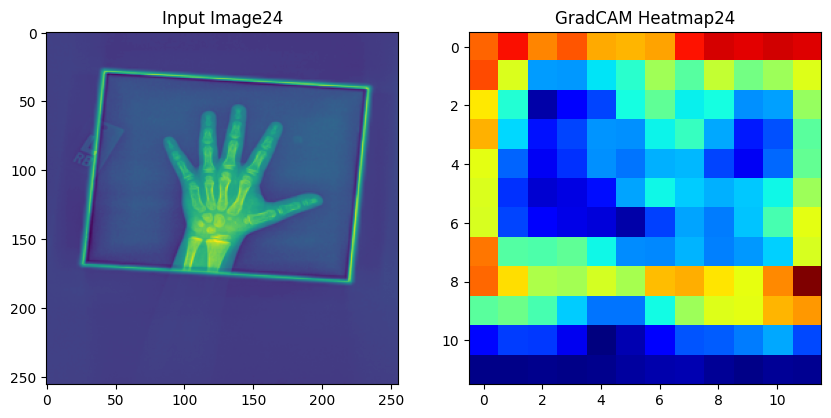

In [300]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input24.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image24')
ax[1].imshow(cam24, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap24')
plt.show()

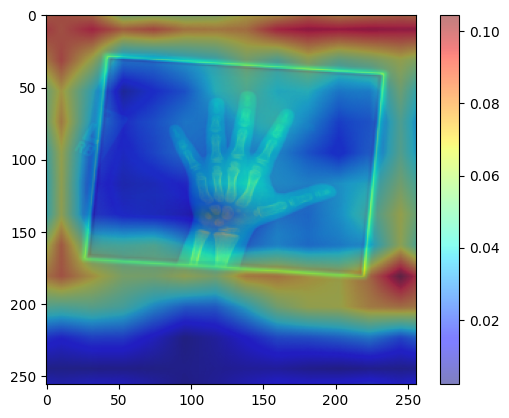

In [301]:
plt.imshow(input24.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam24, (input24.shape[2],input24.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap=6'jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image25

In [302]:
input25 = transform(Image.open(dataset_path('boneage_training_dataset/1972.png')).resize((256,256))).double()  # replace with your input
input25

tensor([[[0.1490, 0.1490, 0.1451,  ..., 0.1608, 0.1608, 0.1608],
         [0.1490, 0.1490, 0.1490,  ..., 0.1608, 0.1608, 0.1608],
         [0.1529, 0.1490, 0.1490,  ..., 0.1608, 0.1608, 0.1608],
         ...,
         [0.1843, 0.1882, 0.1843,  ..., 0.1765, 0.1804, 0.1804],
         [0.1843, 0.1843, 0.1843,  ..., 0.1804, 0.1804, 0.1843],
         [0.1843, 0.1843, 0.1843,  ..., 0.1804, 0.1804, 0.1804]]],
       dtype=torch.float64)

In [303]:
m25 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m25

tensor([1.], dtype=torch.float64)

In [304]:
input25 = input25.resize(1,1,256,256)
input25

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[[[0.1490, 0.1490, 0.1451,  ..., 0.1608, 0.1608, 0.1608],
          [0.1490, 0.1490, 0.1490,  ..., 0.1608, 0.1608, 0.1608],
          [0.1529, 0.1490, 0.1490,  ..., 0.1608, 0.1608, 0.1608],
          ...,
          [0.1843, 0.1882, 0.1843,  ..., 0.1765, 0.1804, 0.1804],
          [0.1843, 0.1843, 0.1843,  ..., 0.1804, 0.1804, 0.1843],
          [0.1843, 0.1843, 0.1843,  ..., 0.1804, 0.1804, 0.1804]]]],
       dtype=torch.float64)

In [305]:
m25 = m25.resize(1,1)
m25

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[1.]], dtype=torch.float64)

In [306]:
output25= model(input25, m25)
output25

tensor([[-0.8968]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [307]:
features = []
def get_features_hook(model, input25, output25):
    features.append(output25)

hook_handle25 = model.conv5.register_forward_hook(get_features_hook)
output25 = model(input25,m25)
hook_handle25.remove()

feature_maps25 = features[0]
gradients25 = model.conv5.weight.grad

In [308]:
weights25 = torch.mean(gradients25, axis=(2, 3))
cam25 = torch.zeros(feature_maps25.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights25[0]):
    cam25 += w * feature_maps25[0, i, :, :]
cam25 = torch.nn.functional.relu(cam25)
cam25 = cam25.detach().numpy()

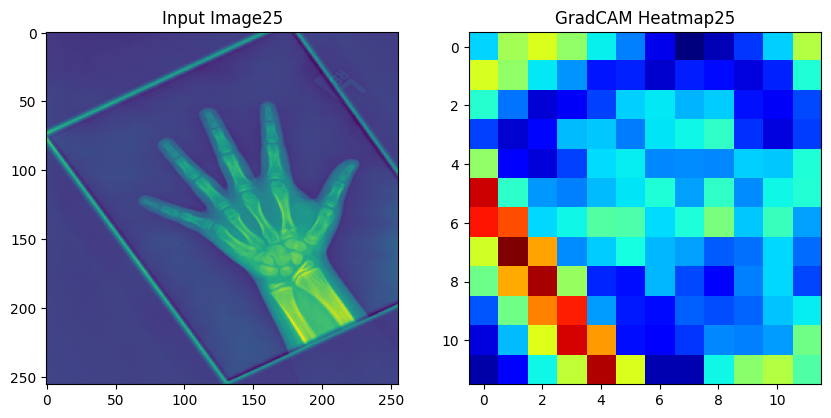

In [309]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input25.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image25')
ax[1].imshow(cam25, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap25')
plt.show()

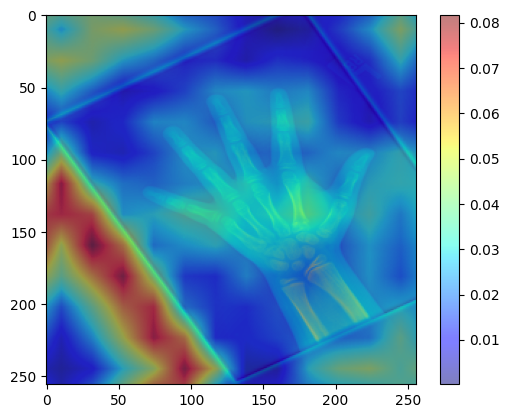

In [310]:
plt.imshow(input25.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam25, (input25.shape[2],input25.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap=6'jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image26

In [311]:
input26 = transform(Image.open(dataset_path('boneage_training_dataset/2391.png')).resize((256,256))).double()  # replace with your input
input26

tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]], dtype=torch.float64)

In [312]:
m26 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m26

tensor([1.], dtype=torch.float64)

In [313]:
input26 = input26.resize(1,1,256,256)
input26

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]]], dtype=torch.float64)

In [314]:
m26 = m26.resize(1,1)
m26

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[1.]], dtype=torch.float64)

In [315]:
output26= model(input26, m26)
output26

tensor([[1.3508]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [316]:
features = []
def get_features_hook(model, input26, output26):
    features.append(output26)

hook_handle26 = model.conv5.register_forward_hook(get_features_hook)
output26 = model(input26,m26)
hook_handle26.remove()

feature_maps26 = features[0]
gradients26 = model.conv5.weight.grad

In [318]:
weights26 = torch.mean(gradients26, axis=(2, 3))
cam26 = torch.zeros(feature_maps26.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights26[0]):
    cam26 += w * feature_maps26[0, i, :, :]
cam26 = torch.nn.functional.relu(cam26)
cam26 = cam26.detach().numpy()

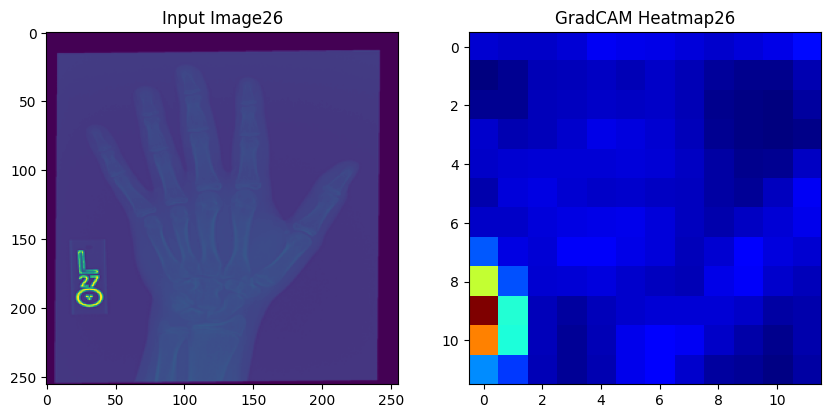

In [319]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input26.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image26')
ax[1].imshow(cam26, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap26')
plt.show()

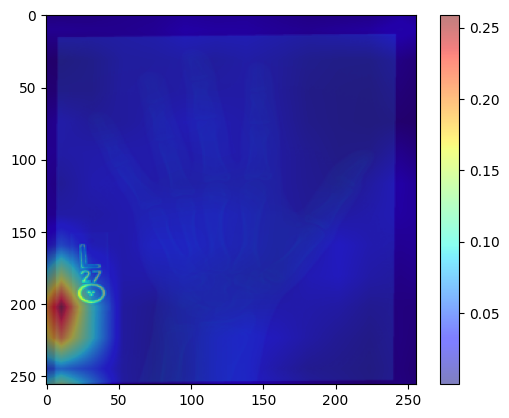

In [320]:
plt.imshow(input26.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam26, (input26.shape[2],input26.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap=6'jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image27

In [321]:
input27 = transform(Image.open(dataset_path('boneage_training_dataset/2344.png')).resize((256,256))).double()  # replace with your input
input27

tensor([[[0.1804, 0.1765, 0.1725,  ..., 0.1686, 0.1686, 0.1686],
         [0.1804, 0.1765, 0.1725,  ..., 0.1765, 0.1725, 0.1725],
         [0.1804, 0.1804, 0.1765,  ..., 0.1686, 0.1765, 0.1843],
         ...,
         [0.2078, 0.2039, 0.1961,  ..., 0.1922, 0.1922, 0.1843],
         [0.2039, 0.2000, 0.1922,  ..., 0.1882, 0.1882, 0.1882],
         [0.2000, 0.1961, 0.1961,  ..., 0.1843, 0.1882, 0.1843]]],
       dtype=torch.float64)

In [322]:
m27 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m27

tensor([1.], dtype=torch.float64)

In [324]:
input27 = input27.resize(1,1,256,256)
input27

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[[[0.1804, 0.1765, 0.1725,  ..., 0.1686, 0.1686, 0.1686],
          [0.1804, 0.1765, 0.1725,  ..., 0.1765, 0.1725, 0.1725],
          [0.1804, 0.1804, 0.1765,  ..., 0.1686, 0.1765, 0.1843],
          ...,
          [0.2078, 0.2039, 0.1961,  ..., 0.1922, 0.1922, 0.1843],
          [0.2039, 0.2000, 0.1922,  ..., 0.1882, 0.1882, 0.1882],
          [0.2000, 0.1961, 0.1961,  ..., 0.1843, 0.1882, 0.1843]]]],
       dtype=torch.float64)

In [325]:
m27 = m27.resize(1,1)
m27

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[1.]], dtype=torch.float64)

In [326]:
output27= model(input27, m27)
output27

tensor([[1.7729]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [327]:
features = []
def get_features_hook(model, input27, output27):
    features.append(output27)

hook_handle27 = model.conv5.register_forward_hook(get_features_hook)
output27 = model(input27,m27)
hook_handle27.remove()

feature_maps27 = features[0]
gradients27 = model.conv5.weight.grad

In [329]:
weights27 = torch.mean(gradients27, axis=(2, 3))
cam27 = torch.zeros(feature_maps27.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights27[0]):
    cam27 += w * feature_maps27[0, i, :, :]
cam27 = torch.nn.functional.relu(cam27)
cam27 = cam27.detach().numpy()

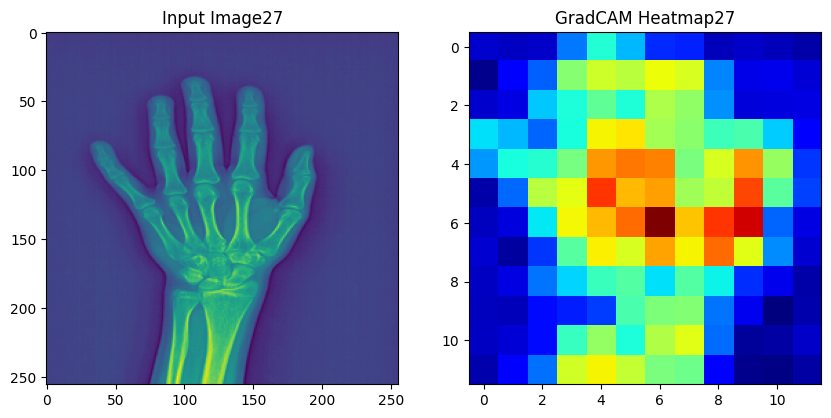

In [330]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input27.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image27')
ax[1].imshow(cam27, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap27')
plt.show()

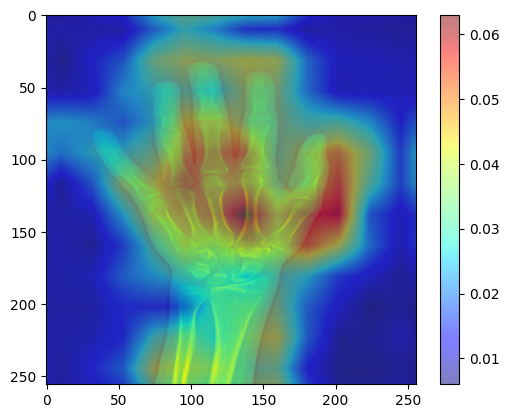

In [331]:
plt.imshow(input27.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam27, (input27.shape[2],input27.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap=6'jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image28

In [332]:
input28 = transform(Image.open(dataset_path('boneage_training_dataset/2345.png')).resize((256,256))).double()  # replace with your input
input28

tensor([[[0.1686, 0.1686, 0.1686,  ..., 0.1608, 0.1569, 0.1608],
         [0.1686, 0.1686, 0.1686,  ..., 0.1647, 0.1569, 0.1608],
         [0.1686, 0.1725, 0.1765,  ..., 0.1647, 0.1647, 0.1686],
         ...,
         [0.1882, 0.1882, 0.1843,  ..., 0.1804, 0.1804, 0.1843],
         [0.1922, 0.1843, 0.1882,  ..., 0.1843, 0.1843, 0.1882],
         [0.1922, 0.1922, 0.1922,  ..., 0.1922, 0.1843, 0.1765]]],
       dtype=torch.float64)

In [333]:
m28 = torch.from_numpy(np.array([1.0])).double() # given that it's a picture of "male"
m28

tensor([1.], dtype=torch.float64)

In [334]:
input28 = input28.resize(1,1,256,256)
input28

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[[[0.1686, 0.1686, 0.1686,  ..., 0.1608, 0.1569, 0.1608],
          [0.1686, 0.1686, 0.1686,  ..., 0.1647, 0.1569, 0.1608],
          [0.1686, 0.1725, 0.1765,  ..., 0.1647, 0.1647, 0.1686],
          ...,
          [0.1882, 0.1882, 0.1843,  ..., 0.1804, 0.1804, 0.1843],
          [0.1922, 0.1843, 0.1882,  ..., 0.1843, 0.1843, 0.1882],
          [0.1922, 0.1922, 0.1922,  ..., 0.1922, 0.1843, 0.1765]]]],
       dtype=torch.float64)

In [335]:
m28 = m28.resize(1,1)
m28

/usr/local/lib/python3.9/dist-packages/torch/_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[1.]], dtype=torch.float64)

In [336]:
output28= model(input28, m28)
output28

tensor([[1.4830]], dtype=torch.float64, grad_fn=<AddmmBackward0>)

In [337]:
features = []
def get_features_hook(model, input28, output28):
    features.append(output28)

hook_handle28 = model.conv5.register_forward_hook(get_features_hook)
output28 = model(input28,m28)
hook_handle28.remove()

feature_maps28 = features[0]
gradients28 = model.conv5.weight.grad

In [338]:
weights28 = torch.mean(gradients28, axis=(2, 3))
cam28 = torch.zeros(feature_maps28.shape[2:], dtype=torch.float32)
for i, w in enumerate(weights28[0]):
    cam28 += w * feature_maps28[0, i, :, :]
cam28 = torch.nn.functional.relu(cam28)
cam28 = cam28.detach().numpy()

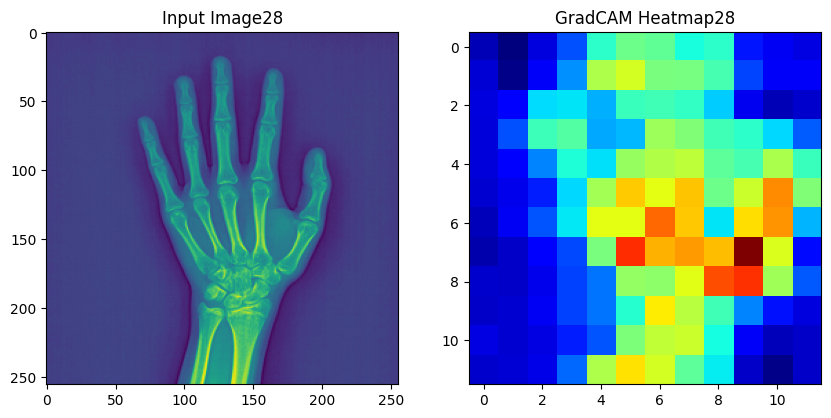

In [339]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(input28.squeeze().detach().numpy())
#ax[0].axis('off')
ax[0].set_title('Input Image28')
ax[1].imshow(cam28, cmap='jet')
#ax[1].axis('off')
ax[1].set_title('GradCAM Heatmap28')
plt.show()

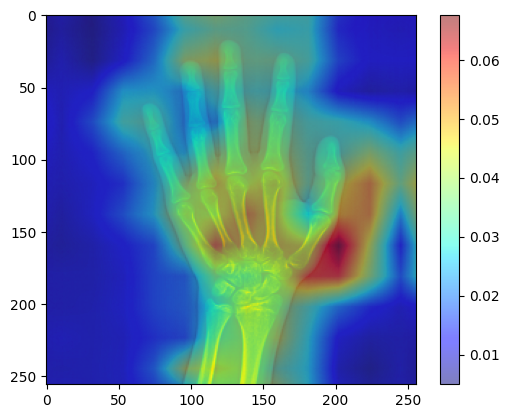

In [340]:
plt.imshow(input28.squeeze().detach().numpy())
plt.imshow(skimage.transform.resize(cam28, (input28.shape[2],input28.shape[3] )), alpha=0.5, cmap='jet')
plt.colorbar()
#plt.imshow(cam.detach().numpy(), alpha=0.5,cmap=6'jet')
#y_pred = str(y_pred.cpu().data.numpy())
#ax[1].set_title(y_pred)
#fig.tight_layout()

#Image29

In [341]:
input29 = transform(Image.open(dataset_path('boneage_training_dataset/2359.png')).resize((256,256))).double()  # replace with your input
input29

tensor([[[0.2000, 0.1961, 0.1882,  ..., 0.1765, 0.1765, 0.1765],
         [0.1922, 0.1922, 0.1843,  ..., 0.1765, 0.1843, 0.1765],
         [0.1922, 0.1882, 0.1804,  ..., 0.1765, 0.1804, 0.1804],
         ...,
         [0.1961, 0.2000, 0.2039,  ..., 0.1922, 0.1922, 0.1882],
         [0.1961, 0.2000, 0.1961,  ..., 0.1922, 0.1922, 0.1922],
         [0.1961, 0.1961, 0.1922,  ..., 0.1961, 0.1922, 0.1882]]],
       dtype=torch.float64)